In [1]:
from dataloader import DataLoader
loader = DataLoader()

_initialize_data took 64.9364 seconds


In [2]:
df = loader.get_data(hs_code=282520)

### Export/Import Analysis

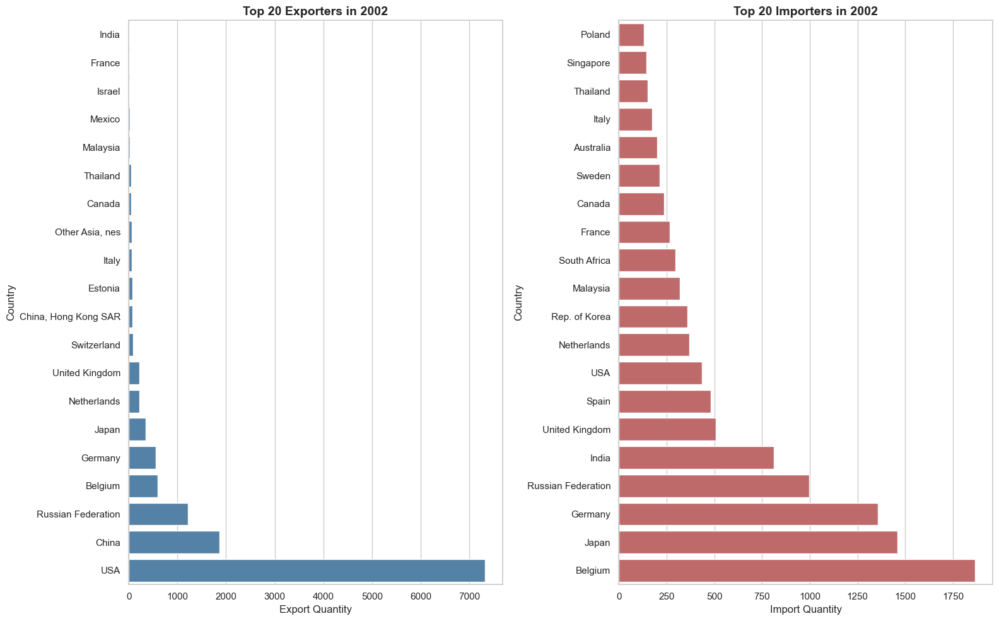

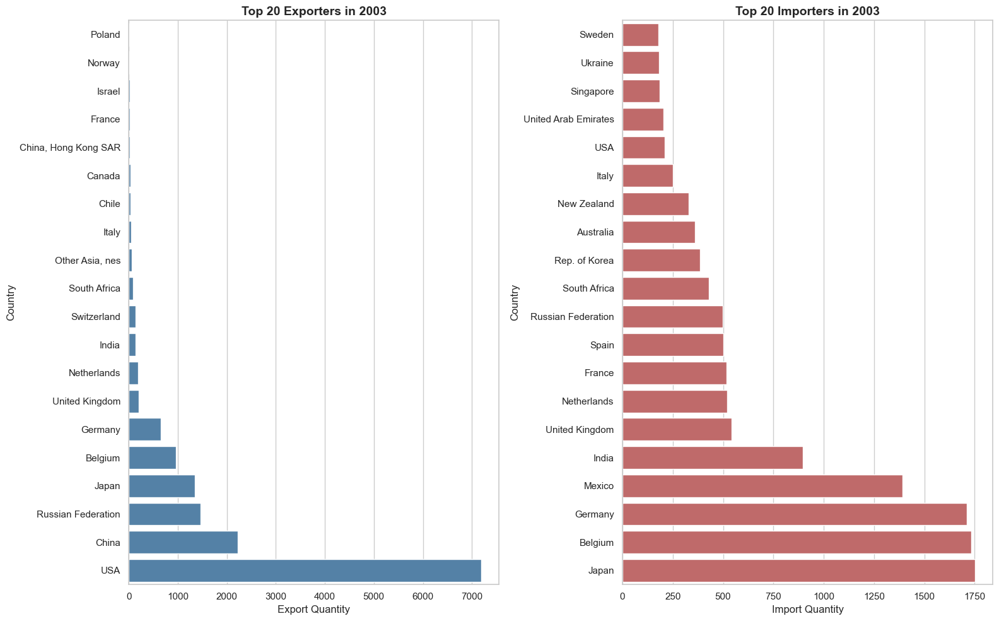

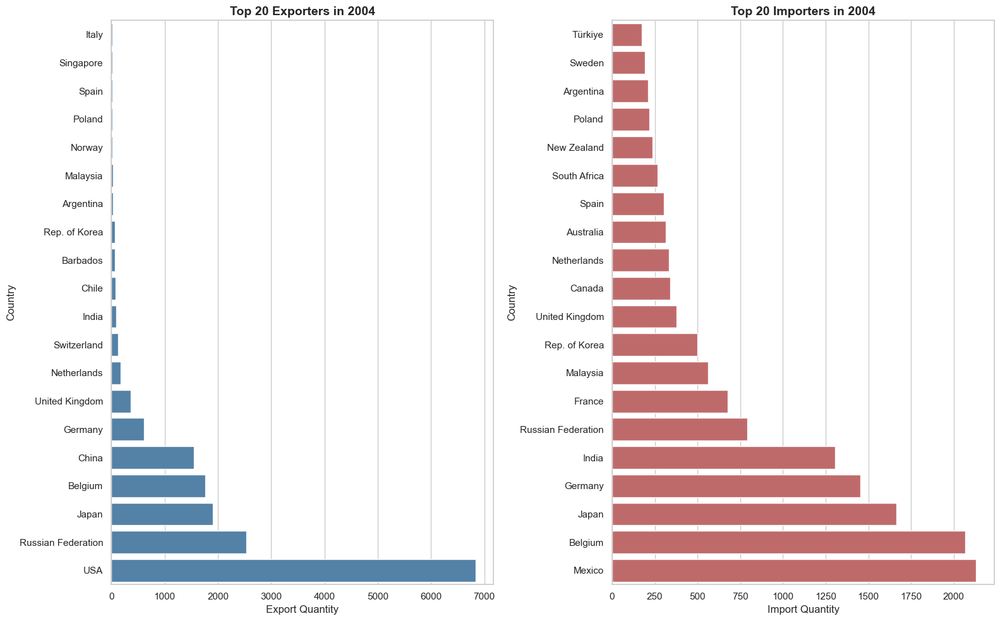

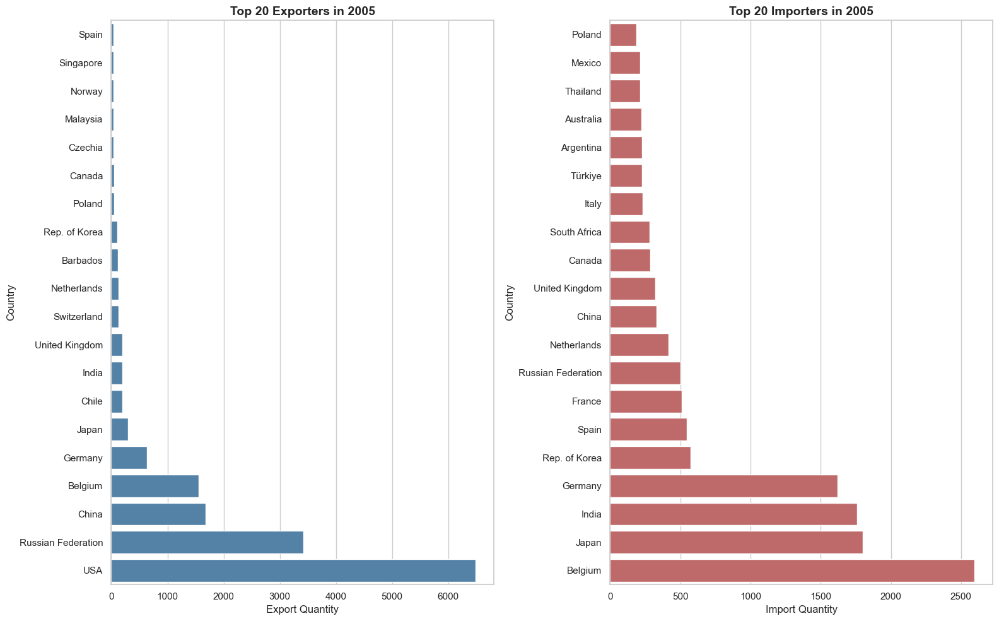

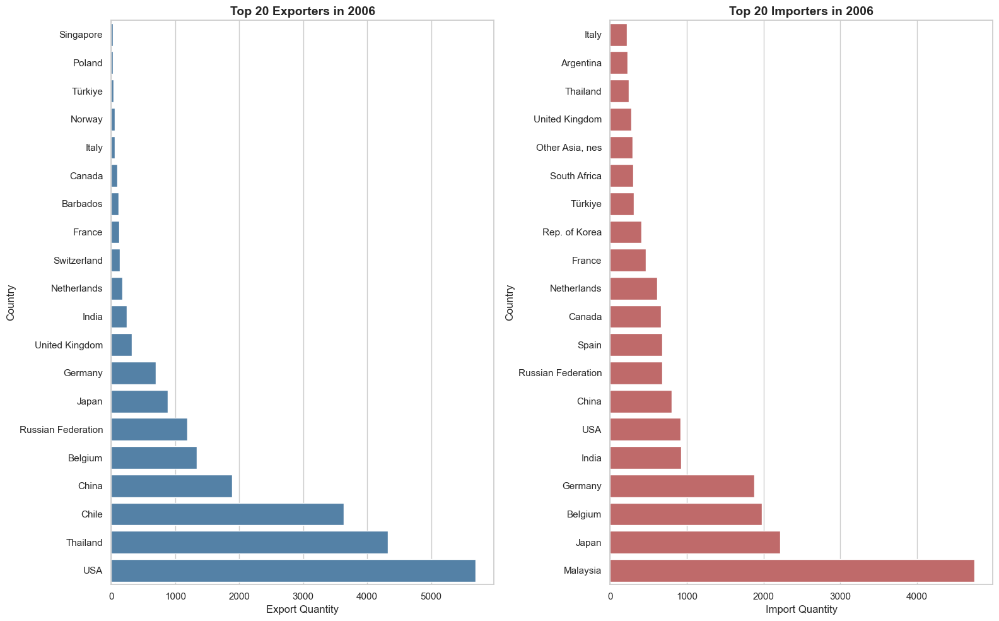

...

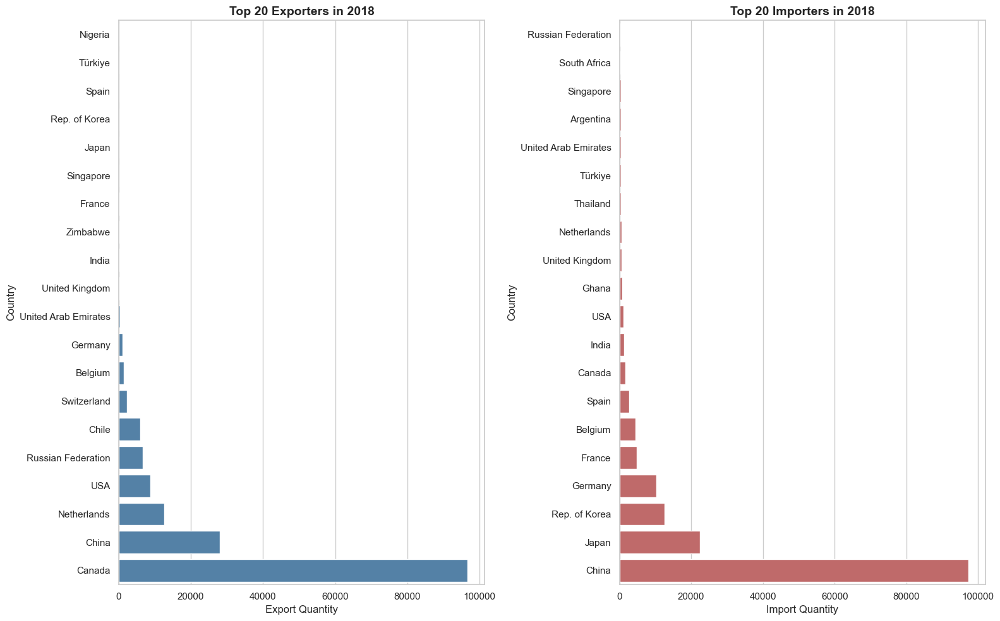

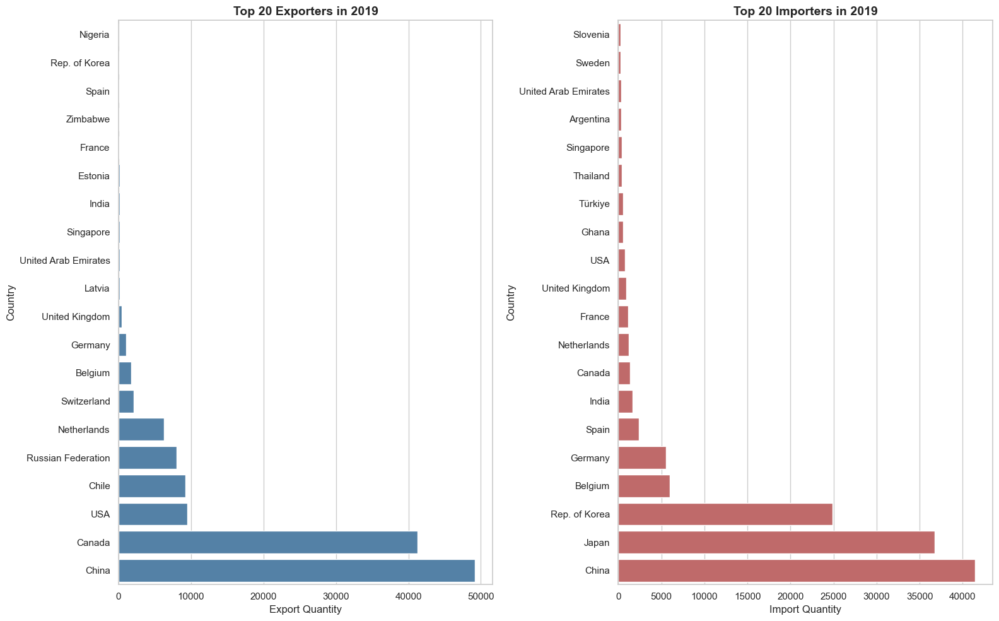

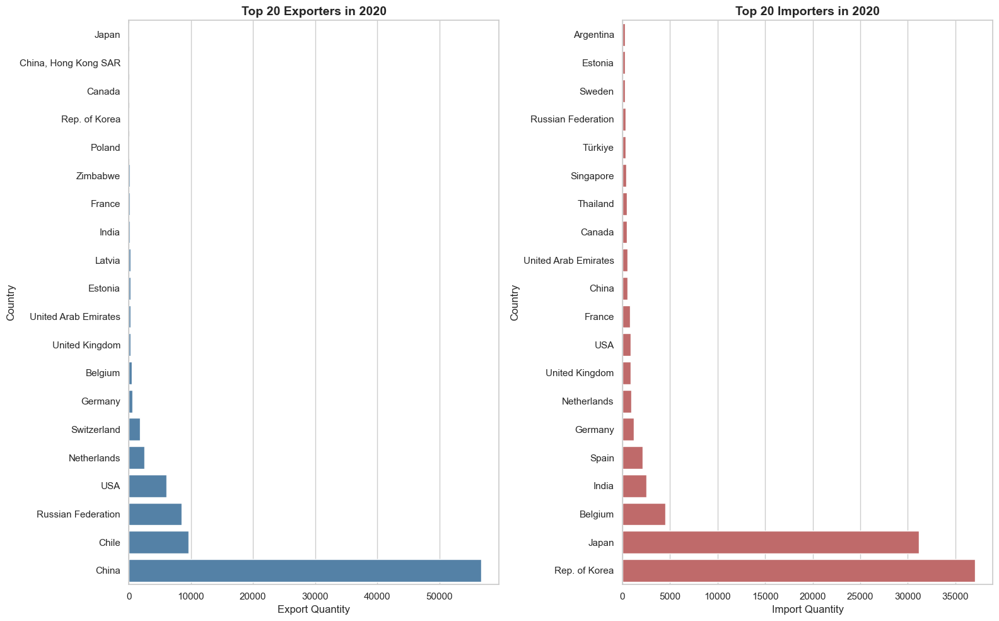

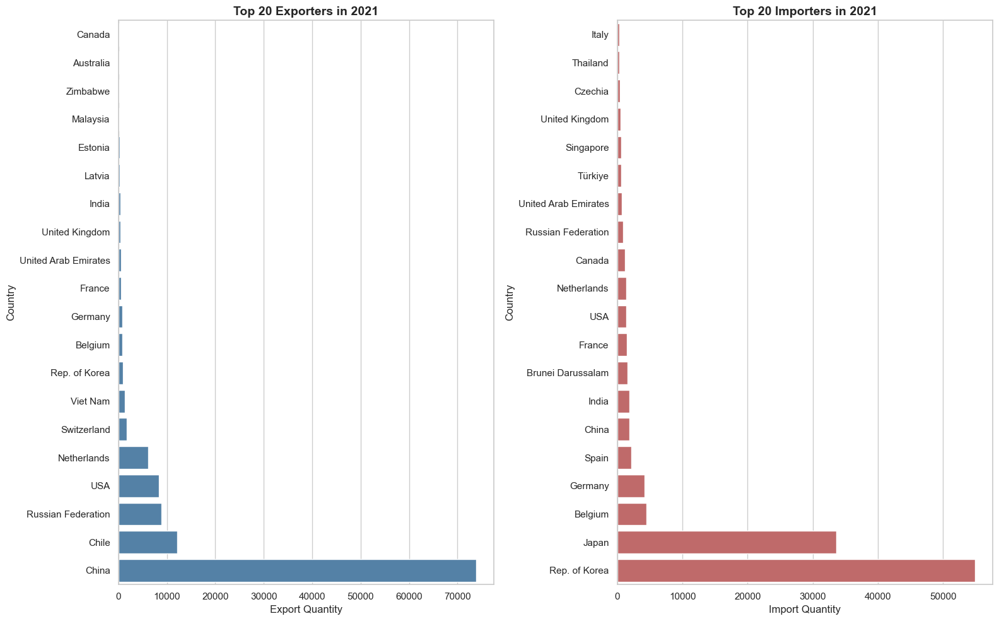

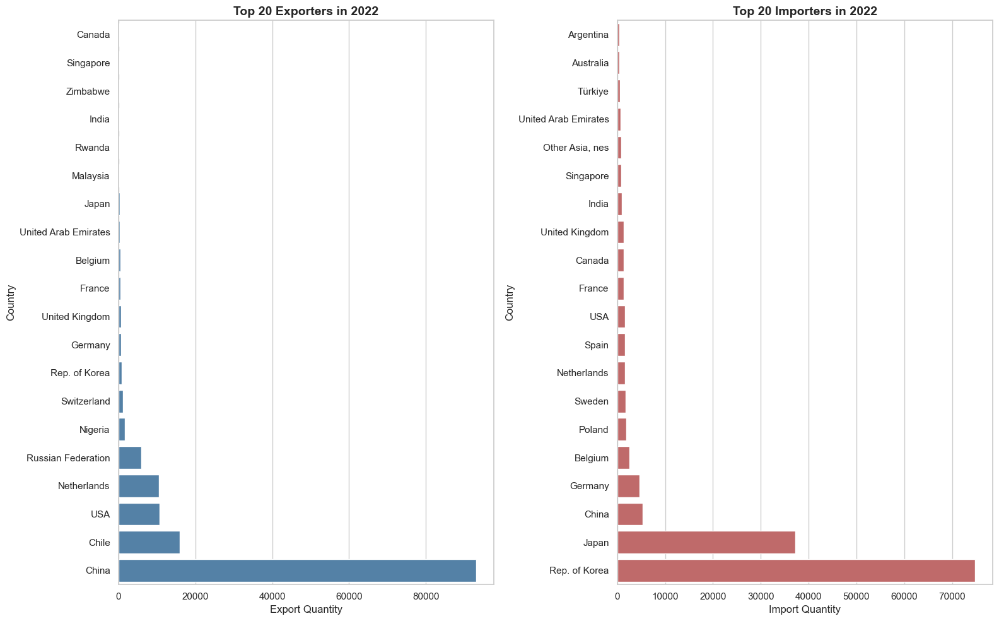

In [46]:
import polars as pl
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

###################################################
# Data Selection
###################################################
df_lithium = df.filter(pl.col("k") == 282520).to_pandas()
df_lithium['t'] = df_lithium['t'].astype(int)
years = sorted(df_lithium['t'].unique())
top_n = 20

###################################################
# Visualization over Time
###################################################
sns.set_theme(style="whitegrid")

for y in years:
    df_year = df_lithium[df_lithium['t'] == y]

    # Aggregation by Exporter
    exports = df_year.groupby("export_country")['q'].sum().reset_index()
    exports = exports.sort_values('q', ascending=False).head(top_n)

    # Aggregation by Importer
    imports = df_year.groupby("import_country")['q'].sum().reset_index()
    imports = imports.sort_values('q', ascending=False).head(top_n)

    fig, axs = plt.subplots(1, 2, figsize=(16,10))
    
    # Visualization of Exporters
    exports = exports.sort_values('q')
    sns.barplot(x='q', y='export_country', data=exports, ax=axs[0], color='steelblue')
    axs[0].set_title(f"Top {top_n} Exporters in {y}", fontsize=14, fontweight='bold')
    axs[0].set_xlabel("Export Quantity")
    axs[0].set_ylabel("Country")
    
    # Visualization of Importers
    imports = imports.sort_values('q')
    sns.barplot(x='q', y='import_country', data=imports, ax=axs[1], color='indianred')
    axs[1].set_title(f"Top {top_n} Importers in {y}", fontsize=14, fontweight='bold')
    axs[1].set_xlabel("Import Quantity")
    axs[1].set_ylabel("Country")

    plt.tight_layout()
    plt.show()


## Graph Machine Learning

In [3]:
import polars as pl
import numpy as np
import pandas as pd
import torch
from torch import nn
from torch_geometric.data import Data
from torch_geometric.nn import GCNConv, GAE
import torch.nn.functional as F
import networkx as nx
from sklearn.preprocessing import StandardScaler

import warnings
warnings.filterwarnings("ignore")

###################################################
# Parameters
###################################################
product_code = 282520
start_year = 2005
end_year = 2022
window_size = 3
epochs = 50
lr = 0.01
embedding_dim = 32
hidden_dim = 64

# DEVICE
if torch.backends.mps.is_available():
    device = torch.device("mps")
elif torch.cuda.is_available():
    device = torch.device("cuda")
else:
    device = torch.device("cpu")
print(f"Using device: {device}")

###################################################
# Load and Filter Data
###################################################
df_lithium = df.filter(pl.col("k") == product_code)

all_years = sorted(df_lithium.select(pl.col("t")).unique().to_series().to_list())
years_of_interest = [y for y in all_years if start_year <= y <= end_year]

if len(years_of_interest) < 2:
    raise ValueError("Not enough years of data for temporal analysis.")

pdf_lithium = df_lithium.to_pandas()
all_countries = np.union1d(pdf_lithium['export_country'].unique(), pdf_lithium['import_country'].unique())
country_to_id = {c: i for i, c in enumerate(all_countries)}
num_nodes = len(all_countries)

/Users/kevinbrundler/Documents/HS24/Network Science/UZH-Network-Science/.venv2/lib/python3.10/site-packages/torch_geometric/typing.py:97: UserWarning: An issue occurred while importing 'torch-cluster'. Disabling its usage. Stacktrace: dlopen(/Users/kevinbrundler/Documents/HS24/Network Science/UZH-Network-Science/.venv2/lib/python3.10/site-packages/torch_cluster/_grid_cpu.so, 0x0006): Symbol not found: __ZN3c106SymInt19promote_to_negativeEv
  Referenced from: <6A93553B-44A9-30CE-B8A9-28BC9FFE9203> /Users/kevinbrundler/Documents/HS24/Network Science/UZH-Network-Science/.venv2/lib/python3.10/site-packages/torch_cluster/_grid_cpu.so
  Expected in:     <3F9923D2-81A5-3EC8-9739-EC0C1C816132> /Users/kevinbrundler/Documents/HS24/Network Science/UZH-Network-Science/.venv2/lib/python3.10/site-packages/torch/lib/libc10.dylib
  warnings.warn(f"An issue occurred while importing 'torch-cluster'. "
/Users/kevinbrundler/Documents/HS24/Network Science/UZH-Network-Science/.venv2/lib/python3.10/site-pack

Using device: cpu


In [4]:
###################################################
# Node Feature Builder
###################################################
def build_node_features_for_year(year_data, all_countries):
    # If GDP features not available, use zero features
    if 'gdpcap_o' not in year_data.columns or 'gdpcap_d' not in year_data.columns:
        node_features = np.zeros((len(all_countries), 2))
        return torch.tensor(node_features, dtype=torch.float)

    export_gdp = year_data.groupby("export_country")["gdpcap_d"].mean().to_dict()
    import_gdp = year_data.groupby("import_country")["gdpcap_o"].mean().to_dict()

    node_features = []
    for c in all_countries:
        gdp_o_val = import_gdp.get(c, 0.0)
        gdp_d_val = export_gdp.get(c, 0.0)
        node_features.append([gdp_o_val, gdp_d_val])
    return torch.tensor(node_features, dtype=torch.float)

In [5]:
###################################################
# Graph Snapshots for each Year
###################################################
edge_feature_cols = ["v"]
scaler = StandardScaler()
all_edge_attrs = pdf_lithium[edge_feature_cols].fillna(0.0)
scaler.fit(all_edge_attrs)

def build_graph_for_year(year):
    year_pdf = pdf_lithium[pdf_lithium['t'] == year]
    if year_pdf.empty:
        return Data(x=torch.zeros((num_nodes,2)), edge_index=torch.empty((2,0), dtype=torch.long))

    x = build_node_features_for_year(year_pdf, all_countries)
    src = year_pdf['export_country'].map(country_to_id)
    dst = year_pdf['import_country'].map(country_to_id)
    edge_index = torch.tensor([src.values, dst.values], dtype=torch.long)

    attrs = year_pdf[edge_feature_cols].fillna(0.0).values
    attrs = scaler.transform(attrs)
    edge_attr = torch.tensor(attrs, dtype=torch.float)

    data = Data(x=x, edge_index=edge_index, edge_attr=edge_attr)
    return data

year_graphs = []
for y in years_of_interest:
    data_y = build_graph_for_year(y)
    year_graphs.append((y, data_y))

In [6]:
###################################################
# GCN Encoder
###################################################
class GCNEncoder(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels):
        super().__init__()
        self.conv1 = GCNConv(in_channels, hidden_channels)
        self.conv2 = GCNConv(hidden_channels, out_channels)

    def forward(self, x, edge_index):
        x = self.conv1(x, edge_index)
        x = F.relu(x)
        x = self.conv2(x, edge_index)
        return x

In [7]:
###################################################
# Training for Yearly Embeddings
###################################################
year_embeddings = {}

for y, data_y in year_graphs:
    data_y = data_y.to(device)
    encoder = GCNEncoder(in_channels=data_y.x.size(1),
                         hidden_channels=hidden_dim,
                         out_channels=embedding_dim)
    model = GAE(encoder=encoder).to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)

    rev_edge_index = torch.stack([data_y.edge_index[1], data_y.edge_index[0]], dim=0)
    full_edge_index = torch.cat([data_y.edge_index, rev_edge_index], dim=1)
    data_y.edge_index = full_edge_index

    model.train()
    for epoch in range(epochs):
        optimizer.zero_grad()
        z = model.encode(data_y.x, data_y.edge_index)
        loss = model.recon_loss(z, data_y.edge_index)
        loss.backward()
        optimizer.step()

    model.eval()
    with torch.no_grad():
        z = model.encode(data_y.x, data_y.edge_index)
    year_embeddings[y] = z.cpu().numpy()

In [8]:
###################################################
# Sliding Window Analysis of Network Structure
###################################################
def build_nx_graph_from_edges(edge_index):
    G = nx.Graph()
    G.add_nodes_from(range(num_nodes))
    for j in range(edge_index.size(1)):
        u = edge_index[0, j].item()
        v = edge_index[1, j].item()
        G.add_edge(u, v)
    return G

window_metrics = []
for i in range(len(years_of_interest) - window_size + 1):
    window_years = years_of_interest[i:i+window_size]
    combined_edge_index = []
    for wy in window_years:
        idx = years_of_interest.index(wy)
        ei = year_graphs[idx][1].edge_index
        combined_edge_index.append(ei)
    combined_edge_index = torch.cat(combined_edge_index, dim=1)
    
    combined_edge_index = torch.unique(combined_edge_index, dim=1)
    
    G_window = build_nx_graph_from_edges(combined_edge_index)
    
    deg_centrality = nx.degree_centrality(G_window)
    bet_centrality = nx.betweenness_centrality(G_window)
    communities = nx.algorithms.community.greedy_modularity_communities(G_window)
    num_communities = len(communities)
    
    window_metrics.append({
        'start_year': window_years[0],
        'end_year': window_years[-1],
        'avg_degree_centrality': np.mean(list(deg_centrality.values())),
        'avg_betweenness_centrality': np.mean(list(bet_centrality.values())),
        'num_communities': num_communities
    })

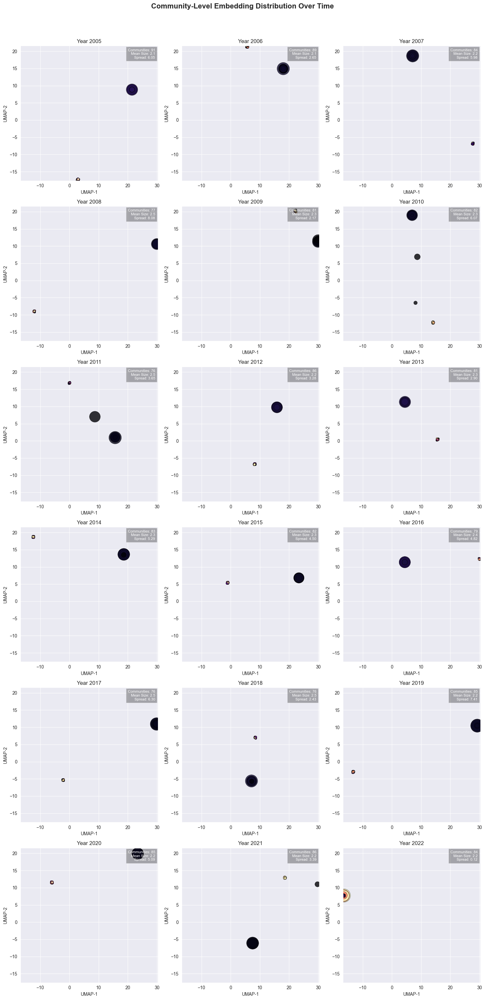

In [9]:
import math
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import networkx as nx
from sklearn.preprocessing import StandardScaler
import umap.umap_ as umap
from scipy.stats import gaussian_kde

num_nodes = len(all_countries)
embedding_dim = list(year_embeddings.values())[0].shape[1]

###################################################
# 1. Community Aggregation by Year
###################################################
def get_communities_for_year(data_y):
    G_y = nx.Graph()
    G_y.add_nodes_from(range(num_nodes))
    for j in range(data_y.edge_index.size(1)):
        u = data_y.edge_index[0, j].item()
        v = data_y.edge_index[1, j].item()
        G_y.add_edge(u, v)
    communities = nx.algorithms.community.greedy_modularity_communities(G_y)
    return communities

year_communities = {}
for y, data_y in year_graphs:
    year_communities[y] = get_communities_for_year(data_y)

###################################################
# Community-Level Embeddings
###################################################
year_comm_embeddings = {}
year_comm_sizes = {}
for y in years_of_interest:
    emb = year_embeddings[y]
    comms = year_communities[y]

    comm_embs = []
    comm_sizes = []
    for cset in comms:
        c_indices = list(cset)
        c_emb = emb[c_indices].mean(axis=0)
        comm_embs.append(c_emb)
        comm_sizes.append(len(c_indices))
    comm_embs = np.array(comm_embs)
    year_comm_embeddings[y] = comm_embs
    year_comm_sizes[y] = np.array(comm_sizes)

all_comm_embeddings = []
comm_labels = []
for y in years_of_interest:
    cemb = year_comm_embeddings[y]
    for i in range(cemb.shape[0]):
        all_comm_embeddings.append(cemb[i])
        comm_labels.append((y, i))

all_comm_embeddings = np.vstack(all_comm_embeddings)
reducer = umap.UMAP(n_neighbors=10, min_dist=0.1, random_state=42)
all_comm_2d = reducer.fit_transform(all_comm_embeddings)

x_min, x_max = all_comm_2d[:,0].min(), all_comm_2d[:,0].max()
y_min, y_max = all_comm_2d[:,1].min(), all_comm_2d[:,1].max()

cols = 3
rows = math.ceil(len(years_of_interest)/cols)
fig, axs = plt.subplots(rows, cols, figsize=(5*cols, 5*rows))
axs = axs.flatten()

###################################################
# Plot Years Arranged in a Grid
###################################################
for idx, y in enumerate(years_of_interest):
    year_indices = [i for i, (yr, _) in enumerate(comm_labels) if yr == y]
    year_embs_2d = all_comm_2d[year_indices]
    x = year_embs_2d[:,0]
    yy = year_embs_2d[:,1]

    xy = np.vstack([x, yy])
    z = gaussian_kde(xy)(xy)
    
    comm_sizes = year_comm_sizes[y]
    size_scaled = 50 * (comm_sizes / comm_sizes.mean())

    ax = axs[idx]
    sc = ax.scatter(x, yy, c=z, cmap='magma', s=size_scaled, alpha=0.8, edgecolors='black', linewidths=0.5)
    ax.set_title(f"Year {y}", fontsize=12)

    ax.set_xlim(x_min, x_max)
    ax.set_ylim(y_min, y_max)
    ax.set_xlabel("UMAP-1")
    ax.set_ylabel("UMAP-2")

    n_comms = len(comm_sizes)
    mean_size = comm_sizes.mean()
    spread = np.sqrt((x.var() + yy.var())/2.0)

    summary_text = (f"Communities: {n_comms}\n"
                    f"Mean Size: {mean_size:.1f}\n"
                    f"Spread: {spread:.2f}")
    ax.text(0.98, 0.98, summary_text, transform=ax.transAxes, 
            va='top', ha='right', fontsize=8,
            bbox=dict(facecolor='black', alpha=0.3, pad=4),
            color='white')

for i in range(len(years_of_interest), len(axs)):
    fig.delaxes(axs[i])

fig.suptitle("Community-Level Embedding Distribution Over Time", fontsize=16, y=1.02, fontweight="bold")
plt.tight_layout()
plt.show()



posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


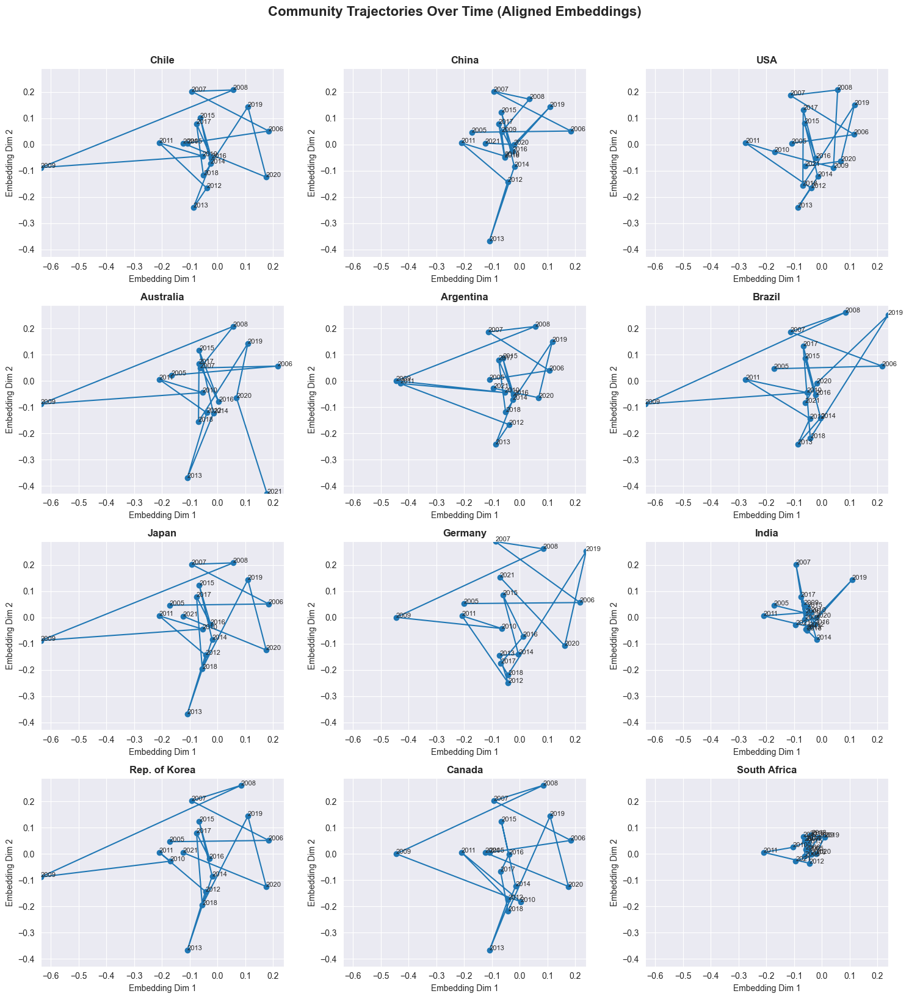

In [10]:
import torch
import torch.nn.functional as F
from torch_geometric.nn import GCNConv, GAE
import numpy as np
import pandas as pd
import networkx as nx
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings("ignore")

num_nodes = len(all_countries)
embedding_dim = 32
hidden_dim = 64
epochs = 50
lr = 0.01

def build_graph_for_year(year):
    year_pdf = pdf_lithium[pdf_lithium['t'] == year]
    if year_pdf.empty:
        data = Data(x=torch.zeros((num_nodes, 2)), edge_index=torch.empty((2,0), dtype=torch.long))
        return data

    x = build_node_features_for_year(year_pdf, all_countries)
    src = year_pdf['export_country'].map(country_to_id)
    dst = year_pdf['import_country'].map(country_to_id)
    edge_index = torch.tensor([src.values, dst.values], dtype=torch.long)

    attrs = year_pdf[edge_feature_cols].fillna(0.0).values
    attrs = scaler.transform(attrs)
    edge_attr = torch.tensor(attrs, dtype=torch.float)

    data = Data(x=x, edge_index=edge_index, edge_attr=edge_attr)
    return data

year_graphs = []
for y in years_of_interest:
    year_graphs.append((y, build_graph_for_year(y)))

##############################################
# GCN Encoder for GAE
##############################################
class GCNEncoder(torch.nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels):
        super().__init__()
        self.conv1 = GCNConv(in_channels, hidden_channels)
        self.conv2 = GCNConv(hidden_channels, out_channels)

    def forward(self, x, edge_index):
        x = self.conv1(x, edge_index)
        x = F.relu(x)
        x = self.conv2(x, edge_index)
        return x

##############################################
# Training
##############################################
year_embeddings = {}
device = torch.device("cuda" if torch.cuda.is_available() else "cpu") # Couldn't make mps work here for some reason

for y, data_y in year_graphs:
    data_y = data_y.to(device)

    encoder = GCNEncoder(in_channels=data_y.x.size(1), hidden_channels=hidden_dim, out_channels=embedding_dim)
    model = GAE(encoder=encoder).to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)

    rev_edge_index = torch.stack([data_y.edge_index[1], data_y.edge_index[0]], dim=0)
    full_edge_index = torch.cat([data_y.edge_index, rev_edge_index], dim=1)
    data_y.edge_index = full_edge_index

    model.train()
    for epoch in range(epochs):
        optimizer.zero_grad()
        z = model.encode(data_y.x, data_y.edge_index)
        loss = model.recon_loss(z, data_y.edge_index)
        loss.backward()
        optimizer.step()

    model.eval()
    with torch.no_grad():
        z = model.encode(data_y.x, data_y.edge_index)
    year_embeddings[y] = z.cpu().numpy()

##############################################
# Alignment of Embeddings over Time
##############################################
def align_embeddings(ref_emb, target_emb):
    ref_mean = ref_emb.mean(axis=0, keepdims=True)
    tgt_mean = target_emb.mean(axis=0, keepdims=True)
    ref_centered = ref_emb - ref_mean
    tgt_centered = target_emb - tgt_mean
    U, S, Vt = np.linalg.svd(ref_centered.T @ tgt_centered)
    R = U @ Vt
    aligned = (tgt_centered @ R)
    aligned *= (np.linalg.norm(ref_centered) / np.linalg.norm(aligned))
    aligned += ref_mean
    return aligned

ref_year = years_of_interest[0]
ref_emb = year_embeddings[ref_year]
for y in years_of_interest[1:]:
    year_embeddings[y] = align_embeddings(ref_emb, year_embeddings[y])

##############################################
# Community Detection and Tracking
##############################################
year_communities = {}
for y, data_y in year_graphs:
    ei = data_y.edge_index.cpu().numpy() if data_y.edge_index.numel() > 0 else np.empty((2,0),dtype=int)
    G = nx.Graph()
    G.add_nodes_from(range(num_nodes))
    for j in range(ei.shape[1]):
        G.add_edge(ei[0,j], ei[1,j])
    comms = nx.algorithms.community.greedy_modularity_communities(G)
    year_communities[y] = comms

def find_community_for_country(comms, cid):
    for i, cset in enumerate(comms):
        if cid in cset:
            return i
    return None

##############################################
# Visualization of Country Trajectory
##############################################
key_countries = [
    "Chile", "China", "USA", "Australia", "Argentina", 
    "Brazil", "Japan", "Germany", "India", "Rep. of Korea", 
    "Canada", "South Africa"
]

country_ids = {c: country_to_id[c] for c in key_countries if c in country_to_id}

country_trajectories = {}
all_coords = []

for ctry, cid in country_ids.items():
    community_positions_over_time = []
    for y in years_of_interest:
        comms = year_communities[y]
        c_idx = find_community_for_country(comms, cid)
        if c_idx is not None:
            emb = year_embeddings[y]
            c_indices = list(comms[c_idx])
            c_position = emb[c_indices].mean(axis=0)
            community_positions_over_time.append((y, c_position))
    country_trajectories[ctry] = community_positions_over_time

    if len(community_positions_over_time) > 0:
        _, coords = zip(*community_positions_over_time)
        coords = np.array(coords)
        all_coords.append(coords)

if len(all_coords) > 0:
    all_coords_stacked = np.vstack(all_coords)
    x_min = np.nanmin(all_coords_stacked[:,0])
    x_max = np.nanmax(all_coords_stacked[:,0])
    y_min = np.nanmin(all_coords_stacked[:,1])
    y_max = np.nanmax(all_coords_stacked[:,1])
    
else:
    x_min, x_max, y_min, y_max = -1, 1, -1, 1

num_countries = len(country_trajectories)
cols = 3
rows = (num_countries + cols - 1) // cols

fig, axs = plt.subplots(rows, cols, figsize=(5*cols, 4*rows))
axs = axs.flatten()

for i, (ctry, traj) in enumerate(country_trajectories.items()):
    ax = axs[i]
    if len(traj) > 0:
        ys, coords = zip(*traj)
        coords = np.array(coords)
        ax.plot(coords[:,0], coords[:,1], marker='o')
        for j, yy in enumerate(ys):
            ax.text(coords[j,0], coords[j,1], str(yy), fontsize=8)

        ax.set_title(f"{ctry}", fontweight="bold")
        ax.set_xlabel("Embedding Dim 1")
        ax.set_ylabel("Embedding Dim 2")
        ax.set_xlim(x_min, x_max)
        ax.set_ylim(y_min, y_max)
    else:
        ax.text(0.5,0.5,"No Data",ha='center',va='center',fontsize=10)
        ax.set_xlim(x_min, x_max)
        ax.set_ylim(y_min, y_max)
        ax.set_xlabel("Embedding Dim 1")
        ax.set_ylabel("Embedding Dim 2")

for k in range(num_countries, rows*cols):
    fig.delaxes(axs[k])

fig.suptitle("Community Trajectories Over Time (Aligned Embeddings)", fontsize=16, y=1.02, fontweight="bold")
plt.tight_layout()
plt.show()

## Attack Simulation

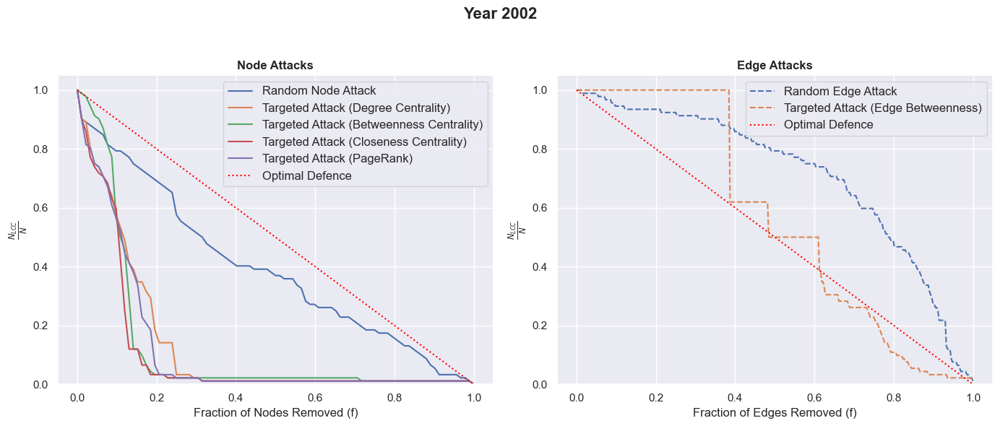

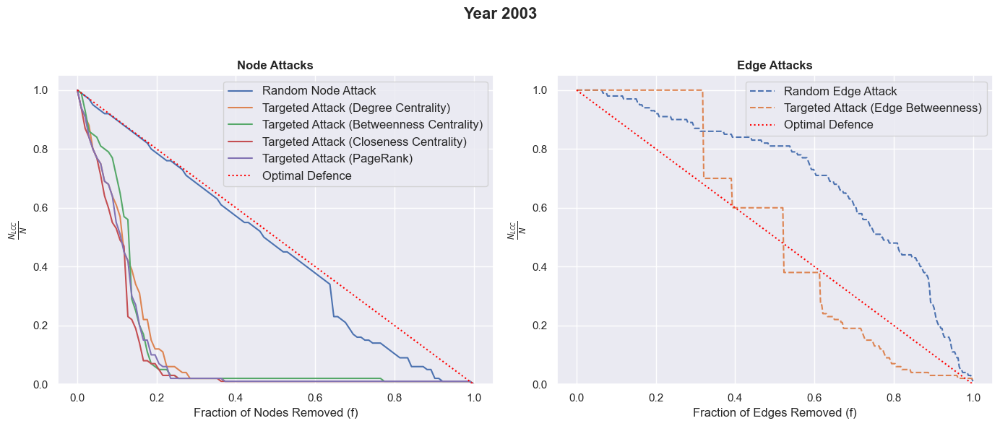

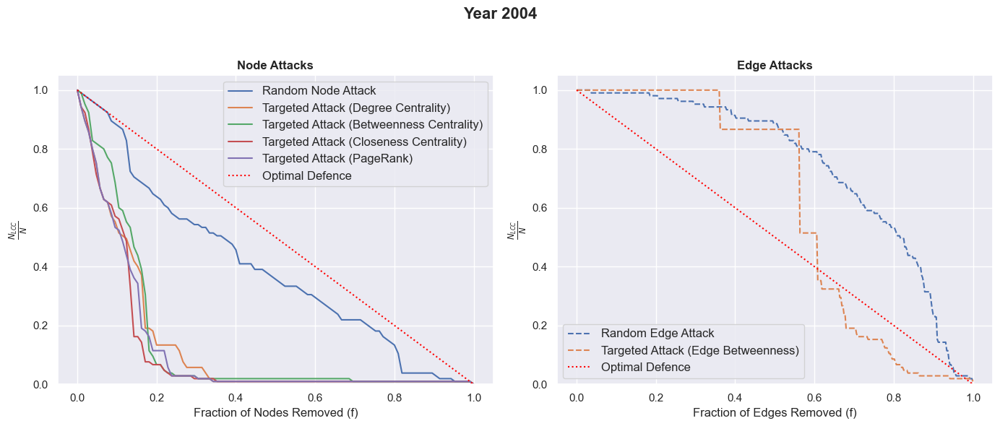

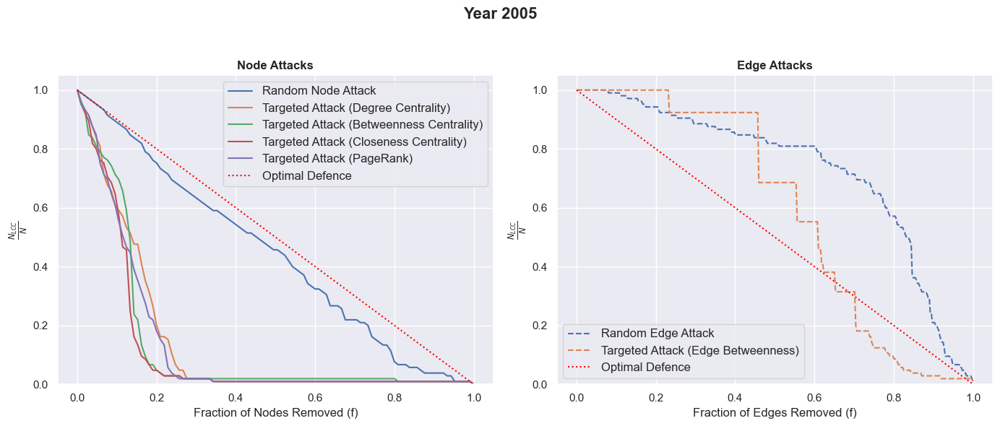

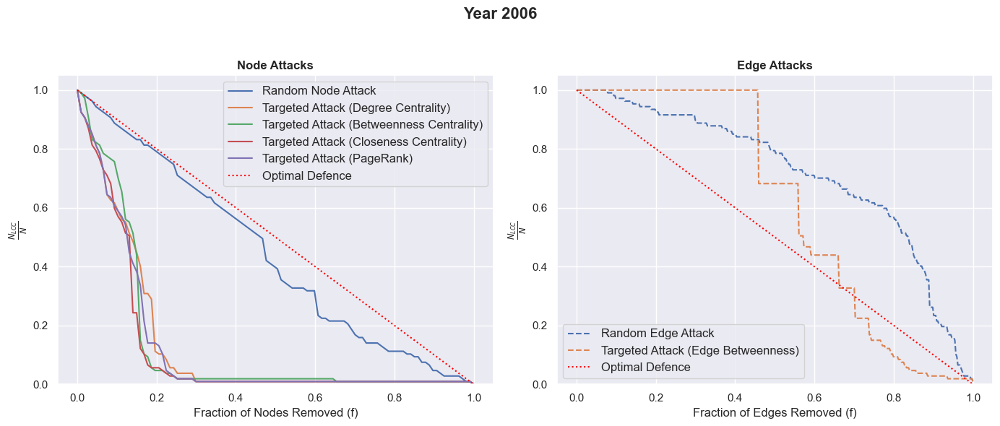

...

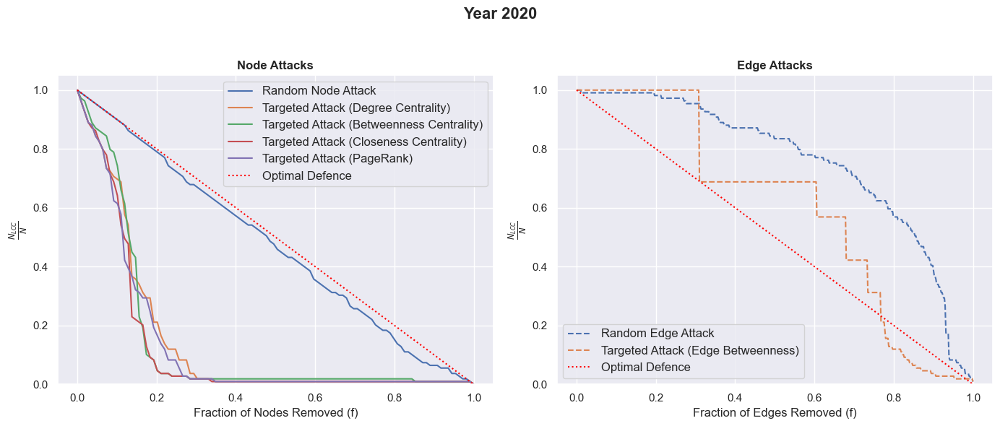

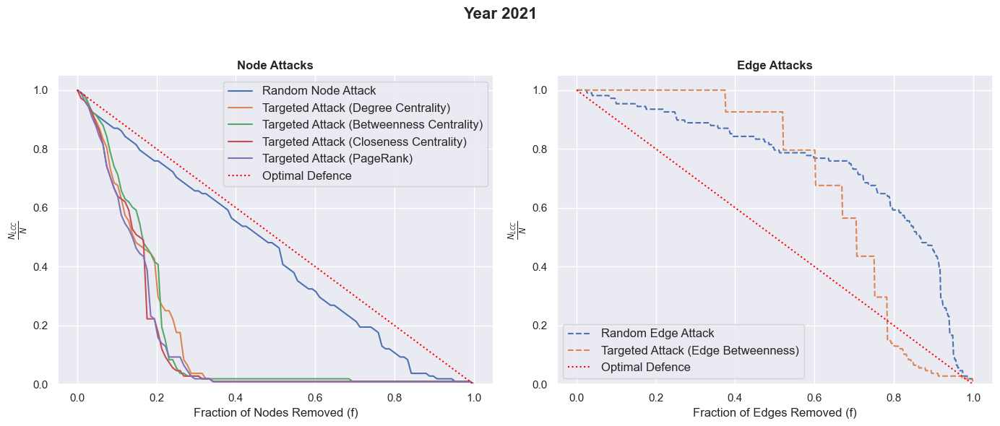

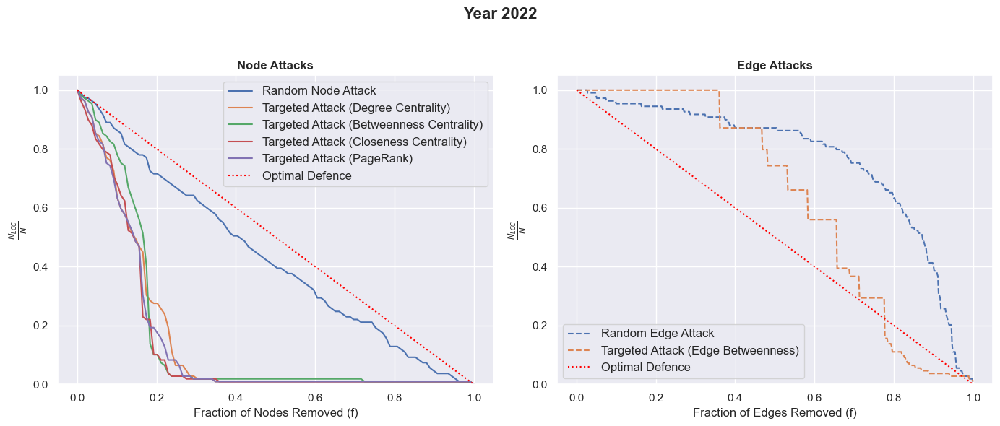

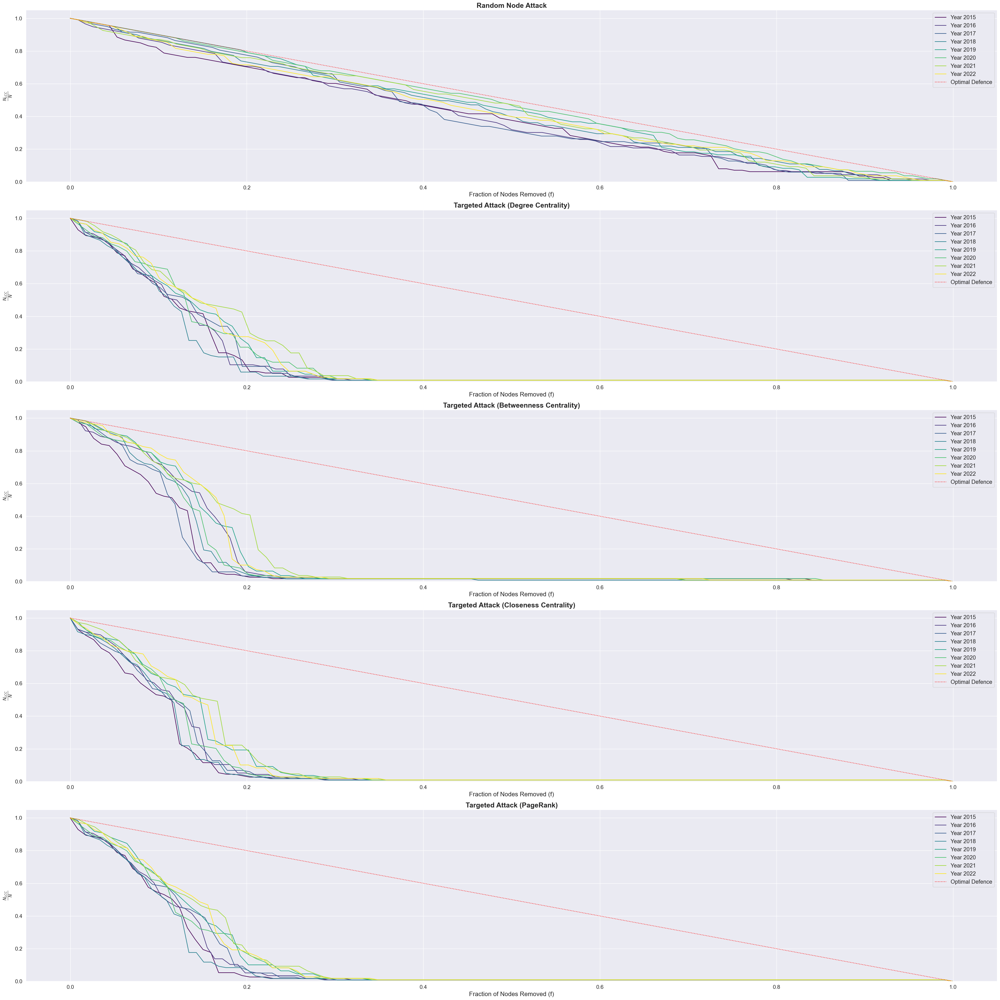

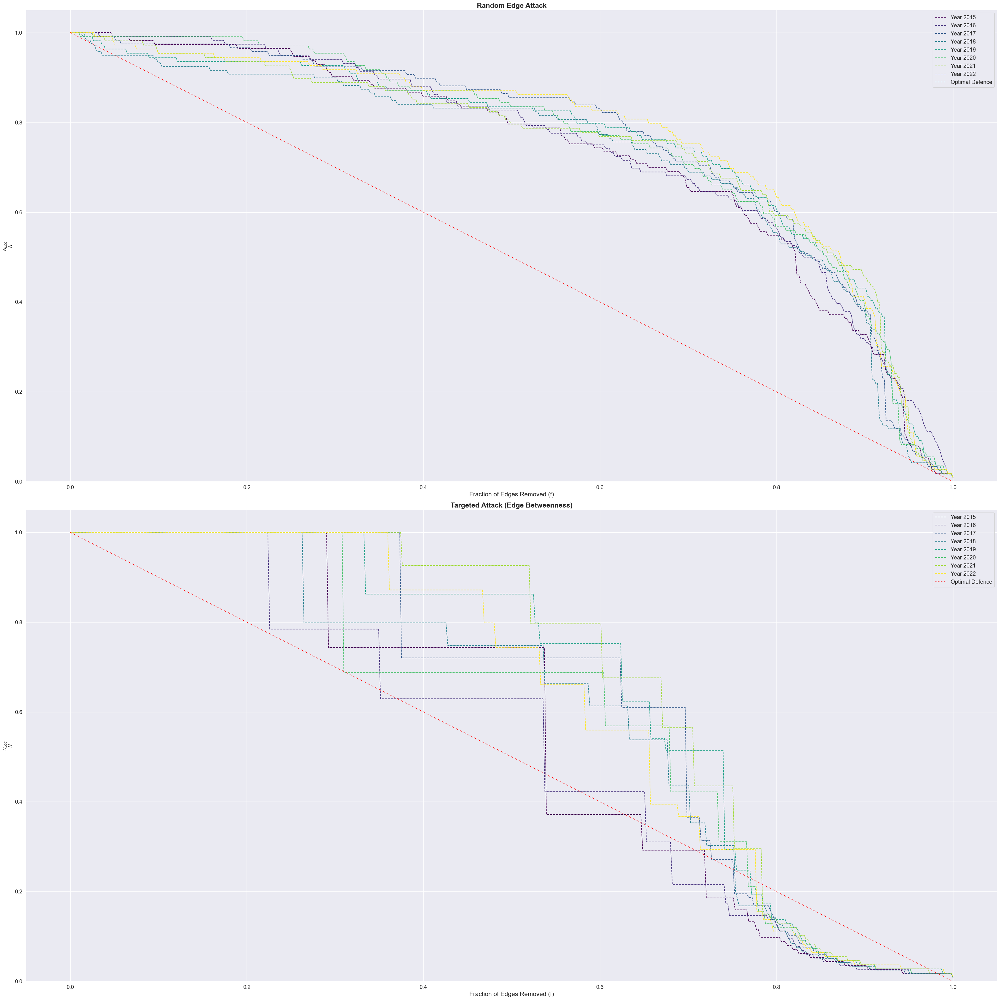

In [20]:
import polars as pl
import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
import seaborn as sns
import random

##############################################
# Setup and Filtering Data
##############################################

df_lithium = df.filter(pl.col("k") == 282520).to_pandas()

sns.set_theme(style="darkgrid")
plt.rcParams['figure.figsize'] = (10, 6)

years = sorted(df_lithium['t'].unique())

##############################################
# Constructing Yearly Networks
##############################################
yearly_graphs = {}
for y in years:
    df_year = df_lithium[df_lithium['t'] == y]
    df_agg = df_year.groupby(['export_country','import_country'], as_index=False)['v'].sum()
    G = nx.Graph()
    for _, row in df_agg.iterrows():
        exporter = row['export_country']
        importer = row['import_country']
        value = row['v']
        if exporter != importer:
            if G.has_edge(exporter, importer):
                G[exporter][importer]['weight'] += value
            else:
                G.add_edge(exporter, importer, weight=value)
    yearly_graphs[y] = G
    
##############################################
# Attack Simulations
##############################################
def targeted_closeness_attack(G):
    """Remove highest closeness node iteratively."""
    G_copy = G.copy()
    lcc_sizes = [largest_cc_size(G_copy)]
    
    while len(G_copy) > 0:
        if len(G_copy) == 1:
            G_copy.remove_node(list(G_copy.nodes())[0])
            lcc_sizes.append(largest_cc_size(G_copy))
            break

        close = nx.closeness_centrality(G_copy)
        target = max(close, key=close.get)
        G_copy.remove_node(target)
        lcc_sizes.append(largest_cc_size(G_copy))
    return lcc_sizes

def targeted_eigenvector_attack(G):
    """Remove highest eigenvector centrality node iteratively."""
    G_copy = G.copy()
    lcc_sizes = [largest_cc_size(G_copy)]

    while len(G_copy) > 0:
        if len(G_copy) == 1:
            G_copy.remove_node(list(G_copy.nodes())[0])
            lcc_sizes.append(largest_cc_size(G_copy))
            break

        eig = nx.eigenvector_centrality(G_copy, max_iter=1000, weight='weight')
        target = max(eig, key=eig.get)
        G_copy.remove_node(target)
        lcc_sizes.append(largest_cc_size(G_copy))
    return lcc_sizes

def targeted_pagerank_attack(G):
    """Remove highest PageRank node iteratively."""
    G_copy = G.copy()
    lcc_sizes = [largest_cc_size(G_copy)]

    while len(G_copy) > 0:
        if len(G_copy) == 1:
            G_copy.remove_node(list(G_copy.nodes())[0])
            lcc_sizes.append(largest_cc_size(G_copy))
            break

        pr = nx.pagerank(G_copy, weight='weight')
        target = max(pr, key=pr.get)
        G_copy.remove_node(target)
        lcc_sizes.append(largest_cc_size(G_copy))
    return lcc_sizes

def targeted_edge_betweenness_attack(G):
    """Remove highest edge betweenness edge iteratively."""
    G_copy = G.copy()
    lcc_sizes = [largest_cc_size(G_copy)]
    
    while G_copy.number_of_edges() > 0:
        edge_bet = nx.edge_betweenness_centrality(G_copy, weight='weight')
        target = max(edge_bet, key=edge_bet.get)
        G_copy.remove_edge(*target)
        lcc_sizes.append(largest_cc_size(G_copy))
    return lcc_sizes

def largest_cc_size(G):
    if len(G) == 0:
        return 0
    return len(max(nx.connected_components(G), key=len))

def random_node_attack(G):
    """Remove nodes at random one by one, record LCC size."""
    nodes = list(G.nodes())
    random.shuffle(nodes)
    lcc_sizes = []
    G_copy = G.copy()
    initial_lcc = largest_cc_size(G_copy)
    lcc_sizes.append(initial_lcc)
    
    for n in nodes:
        G_copy.remove_node(n)
        lcc_sizes.append(largest_cc_size(G_copy))
    return lcc_sizes

def targeted_degree_attack(G):
    """Remove highest-degree node iteratively."""
    G_copy = G.copy()
    lcc_sizes = [largest_cc_size(G_copy)]
    
    while len(G_copy) > 0:
        deg = dict(G_copy.degree(weight='weight'))
        target = max(deg, key=deg.get)
        G_copy.remove_node(target)
        lcc_sizes.append(largest_cc_size(G_copy))
    return lcc_sizes

def targeted_betweenness_dynamic_attack(G):
    """Remove highest betweenness node each iteration (dynamic recalculation)."""
    G_copy = G.copy()
    lcc_sizes = [largest_cc_size(G_copy)]

    while len(G_copy) > 0:
        if len(G_copy) == 1:
            G_copy.remove_node(list(G_copy.nodes())[0])
            lcc_sizes.append(largest_cc_size(G_copy))
            break

        bet = nx.betweenness_centrality(G_copy, weight='weight')
        target = max(bet, key=bet.get)
        G_copy.remove_node(target)
        lcc_sizes.append(largest_cc_size(G_copy))
    return lcc_sizes

def random_edge_attack(G):
    """Remove edges at random one by one, record LCC size."""
    G_copy = G.copy()
    edges = list(G_copy.edges())
    random.shuffle(edges)
    lcc_sizes = [largest_cc_size(G_copy)]
    for e in edges:
        G_copy.remove_edge(*e)
        lcc_sizes.append(largest_cc_size(G_copy))
    return lcc_sizes

##############################################
# Prepare results_list for plot_attacks
##############################################
results_list = []
for y in years:
    G = yearly_graphs[y]
    num_nodes = G.number_of_nodes()
    num_edges = G.number_of_edges()

    random_node_lcc = random_node_attack(G)
    targeted_deg_lcc = targeted_degree_attack(G)
    targeted_bet_lcc = targeted_betweenness_dynamic_attack(G)
    random_edge_lcc = random_edge_attack(G)

    targeted_close_lcc = targeted_closeness_attack(G)
    targeted_pr_lcc = targeted_pagerank_attack(G)
    targeted_edge_bet_lcc = targeted_edge_betweenness_attack(G)

    results = {
        'title': f"Year {y}",
        'num_nodes': num_nodes,
        'num_edges': num_edges,
        'random_node': random_node_lcc,
        'targeted_degree': targeted_deg_lcc,
        'targeted_betweenness_dynamic': targeted_bet_lcc,
        'random_edge': random_edge_lcc,
        'targeted_closeness': targeted_close_lcc,
        'targeted_pagerank': targeted_pr_lcc,
        'targeted_edge_betweenness': targeted_edge_bet_lcc
    }
    results_list.append(results)

##############################################
# Compute AUC (Robustness Index)
##############################################
def compute_auc(fractions, sizes):
    auc = 0.0
    for i in range(len(fractions)-1):
        x1, x2 = fractions[i], fractions[i+1]
        y1, y2 = sizes[i], sizes[i+1]
        auc += (x2 - x1) * (y1 + y2) / 2.0
    return auc

##############################################
# Visualization
##############################################
def plot_attacks(results_list):

    attack_types_node = [
        'random_node',
        'targeted_degree',
        'targeted_betweenness_dynamic',
        'targeted_closeness',
        'targeted_pagerank'
    ]
    
    attack_types_edge = [
        'random_edge',
        'targeted_edge_betweenness'
    ]

    attack_labels = {
        'random_node': 'Random Node Attack',
        'random_edge': 'Random Edge Attack',
        'targeted_degree': 'Targeted Attack (Degree Centrality)',
        'targeted_betweenness_dynamic': 'Targeted Attack (Betweenness Centrality)',
        'targeted_closeness': 'Targeted Attack (Closeness Centrality)',
        'targeted_eigenvector': 'Targeted Attack (Eigenvector Centrality)',
        'targeted_pagerank': 'Targeted Attack (PageRank)',
        'targeted_edge_betweenness': 'Targeted Attack (Edge Betweenness)'
    }

    graph_results = {}
    robustness_summary = []
    
    for results in results_list:
        title = results['title']
        num_nodes = results['num_nodes']
        num_edges = results['num_edges']

        graph_results[title] = {'num_nodes': num_nodes, 'num_edges': num_edges}

        for attack in attack_labels.keys():
            if attack in results:
                lcc_sizes = results[attack]
                initial_lcc_size = lcc_sizes[0]
                sizes = [size / initial_lcc_size for size in lcc_sizes]

                if attack in attack_types_node:
                    fractions_removed = [(i) / num_nodes for i in range(len(sizes))]
                elif attack in attack_types_edge:
                    fractions_removed = [(i) / num_edges for i in range(len(sizes))]
                else:
                    continue
                
                auc_value = compute_auc(fractions_removed, sizes)
                robustness_summary.append((title, attack_labels[attack], auc_value))
                
                graph_results[title][attack] = {
                    'fractions_removed': fractions_removed,
                    'sizes': sizes,
                    'auc': auc_value
                }

    ##############################################
    # Plot Individual Year Figures
    ##############################################
    for title, data in graph_results.items():
        fig, axs = plt.subplots(1, 2, figsize=(14, 6), dpi=100)
        fig.suptitle(title, fontsize=16, fontweight='bold')

        ax = axs[0]
        for attack in attack_types_node:
            if attack in data:
                fractions_removed = data[attack]['fractions_removed']
                sizes = data[attack]['sizes']
                ax.plot(fractions_removed, sizes, label=attack_labels[attack])

        ax.plot([0, 1], [1, 0], linestyle=':', label='Optimal Defence', color='red')
        ax.set_xlabel("Fraction of Nodes Removed (f)", fontsize=12)
        ax.set_ylabel(r"$\frac{N_{LCC}}{N}$", fontsize=12)
        ax.set_title("Node Attacks", fontweight="bold")
        ax.legend(fontsize='medium')
        ax.grid(True)
        ax.set_ylim(0, 1.05)

        ax = axs[1]
        for attack in attack_types_edge:
            if attack in data:
                fractions_removed = data[attack]['fractions_removed']
                sizes = data[attack]['sizes']
                ax.plot(fractions_removed, sizes, label=attack_labels[attack], linestyle='--')
        ax.plot([0, 1], [1, 0], linestyle=':', label='Optimal Defence', color='red')
        ax.set_xlabel("Fraction of Edges Removed (f)", fontsize=12)
        ax.set_ylabel(r"$\frac{N_{LCC}}{N}$", fontsize=12)
        ax.set_title("Edge Attacks", fontweight="bold")
        ax.legend(fontsize='medium')
        ax.grid(True)
        ax.set_ylim(0, 1.05)

        plt.tight_layout(rect=[0, 0, 1, 0.95])
        plt.show()

    ##############################################
    # Prepare data for Aggregated Plots
    ##############################################
    attack_results_node = {attack: {} for attack in attack_types_node}
    attack_results_edge = {attack: {} for attack in attack_types_edge}

    for results in results_list:
        title = results['title']
        num_nodes = results['num_nodes']
        num_edges = results['num_edges']

        for attack in attack_labels.keys():
            if attack in results:
                lcc_sizes = results[attack]
                initial_lcc_size = lcc_sizes[0]
                sizes = [size / initial_lcc_size for size in lcc_sizes]

                if attack in attack_types_node:
                    fractions_removed = [(i) / num_nodes for i in range(len(sizes))]
                    attack_results_node[attack][title] = (fractions_removed, sizes)
                elif attack in attack_types_edge:
                    fractions_removed = [(i) / num_edges for i in range(len(sizes))]
                    attack_results_edge[attack][title] = (fractions_removed, sizes)

    cmap = plt.get_cmap("viridis")

    ##############################################
    # Aggregated Node Attacks
    ##############################################
    num_attacks_node = len(attack_types_node)
    cols = 1
    rows = (num_attacks_node + cols - 1) // cols
    fig, axs = plt.subplots(rows, cols, figsize=(36, 36))
    axs = axs.flatten()
    
    for idx, attack in enumerate(attack_types_node):
        ax = axs[idx]
        titles = list(attack_results_node[attack].keys())

        titles = [t for t in titles if int(t.split()[-1]) >= 2015]
    
        N = len(titles)
        for i, t in enumerate(titles):
            fractions_removed, sizes = attack_results_node[attack][t]
            color = cmap(i / max(1, N-1))
            ax.plot(fractions_removed, sizes, label=t, color=color)
    
        ax.plot([0, 1], [1, 0], linestyle=':', label='Optimal Defence', color='red')
        ax.set_xlabel("Fraction of Nodes Removed (f)", fontsize=16)
        ax.set_ylabel(r"$\frac{N_{LCC}}{N}$", fontsize=16)
        ax.set_title(attack_labels[attack], fontweight="bold", fontsize=18)
        ax.grid(True)
        ax.legend(fontsize='large', loc='upper right')
        ax.set_ylim(0, 1.05)
        ax.tick_params(axis='both', which='major', labelsize=14)
    
    for k in range(num_attacks_node, rows*cols):
        fig.delaxes(axs[k])
    
    plt.tight_layout()
    plt.show()
    
    ##############################################
    # Aggregated Edge Attacks
    ##############################################
    num_attacks_edge = len(attack_types_edge)
    cols = 1
    rows = (num_attacks_edge + cols - 1) // cols
    fig, axs = plt.subplots(rows, cols, figsize=(36, 36))
    if num_attacks_edge == 1:
        axs = [axs]
    
    for idx, attack in enumerate(attack_types_edge):
        ax = axs[idx]
        titles = list(attack_results_edge[attack].keys())

        titles = [t for t in titles if int(t.split()[-1]) >= 2015]
    
        N = len(titles)
        for i, t in enumerate(titles):
            fractions_removed, sizes = attack_results_edge[attack][t]
            color = cmap(i / max(1, N-1))
            ax.plot(fractions_removed, sizes, label=t, linestyle='--', color=color)
    
        ax.plot([0, 1], [1, 0], linestyle=':', label='Optimal Defence', color='red')
        ax.set_xlabel("Fraction of Edges Removed (f)", fontsize=16)
        ax.set_ylabel(r"$\frac{N_{LCC}}{N}$", fontsize=16)
        ax.set_title(attack_labels[attack], fontweight="bold", fontsize=18)
        ax.grid(True)
        ax.legend(fontsize='large', loc='upper right')
        ax.set_ylim(0, 1.05)
        ax.tick_params(axis='both', which='major', labelsize=14)
    
    plt.tight_layout()
    plt.show()
    
    robustness_df = pd.DataFrame(robustness_summary, columns=["Title", "Attack", "AUC"])
    return robustness_df
    
robustness_df = plot_attacks(results_list)

In [21]:
robustness_df

,Title,Attack,AUC
0,Year 2002,Random Node Attack,0.395440
1,Year 2002,Random Edge Attack,0.712006
2,Year 2002,Targeted Attack (Degree Centrality),0.129608
3,Year 2002,Targeted Attack (Betweenness Centrality),0.122873
4,Year 2002,Targeted Attack (Closeness Centrality),0.100662
...,...,...,...
142,Year 2022,Targeted Attack (Degree Centrality),0.149524
143,Year 2022,Targeted Attack (Betweenness Centrality),0.155669
144,Year 2022,Targeted Attack (Closeness Centrality),0.136058
145,Year 2022,Targeted Attack (PageRank),0.140603


## Macro Stats

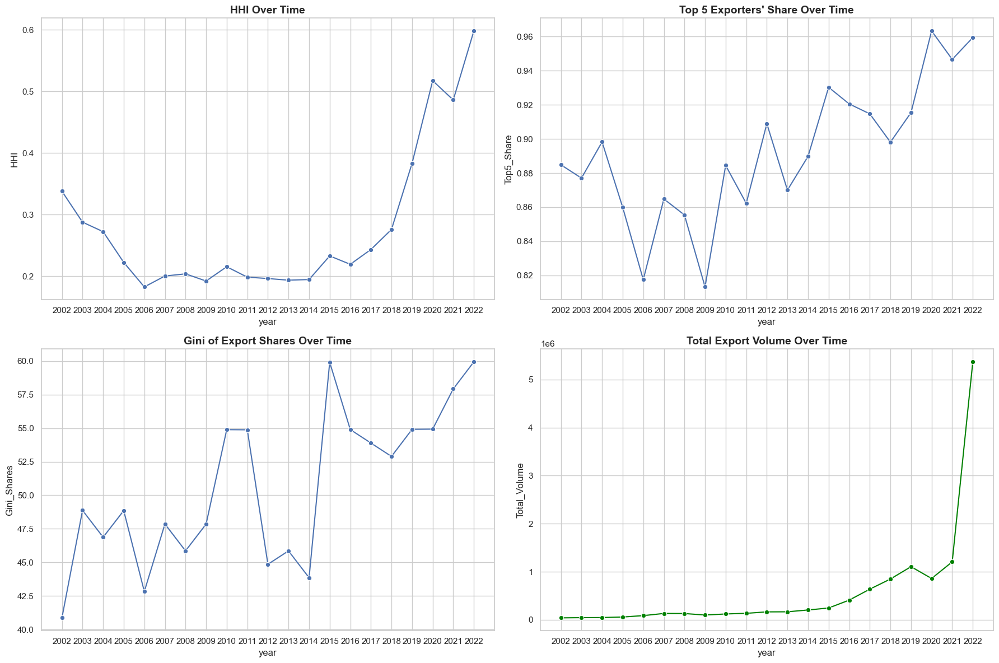

In [29]:
import polars as pl
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

df_lithium = df.filter(pl.col("k") == 282520).to_pandas()
df_lithium['t'] = df_lithium['t'].astype(int)

yearly_exports = (
    df_lithium.groupby(["t", "export_country"], as_index=False)["v"].sum()
)

years_list = []
hhi_list = []
top5_share_list = []
gini_list = []
shannon_list = []
total_volume_list = []

def gini_coefficient(arr):
    arr = np.array(arr)
    arr = arr[arr > 0]
    arr = np.sort(arr)
    n = len(arr)
    if n == 0:
        return np.nan
    
    cumulative = np.cumsum(arr)
    sum_arr = cumulative[-1]
    if sum_arr == 0:
        return 0.0

    rel_cumulative = cumulative / sum_arr
    return (n+1 - 2*np.sum(rel_cumulative)/n)

for year, grp in yearly_exports.groupby("t"):
    total_exports = grp["v"].sum()
    shares = grp["v"] / total_exports

    # HHI (Herfindhal Hirschman Index)
    hhi = (shares ** 2).sum()

    # Top 5 Exporter Share
    sorted_shares = np.sort(shares)[::-1]
    top5 = sorted_shares[:5].sum() if len(sorted_shares)>=5 else sorted_shares.sum()

    # Gini Coefficient of Exporter Share
    gini_val = gini_coefficient(shares.values)

    years_list.append(year)
    hhi_list.append(hhi)
    top5_share_list.append(top5)
    gini_list.append(gini_val)
    total_volume_list.append(total_exports)

metrics_df = pd.DataFrame({
    "year": years_list,
    "HHI": hhi_list,
    "Top5_Share": top5_share_list,
    "Gini_Shares": gini_list,
    "Total_Volume": total_volume_list
})

sns.set_theme(style="whitegrid")
fig, axs = plt.subplots(2, 2, figsize=(18, 12))
axs = axs.flatten()

sns.lineplot(data=metrics_df, x="year", y="HHI", marker="o", ax=axs[0])
axs[0].set_title("HHI Over Time", fontsize=14, fontweight='bold')
axs[0].set_xticks(metrics_df["year"].unique().astype(int))

sns.lineplot(data=metrics_df, x="year", y="Top5_Share", marker="o", ax=axs[1])
axs[1].set_title("Top 5 Exporters' Share Over Time", fontsize=14, fontweight='bold')
axs[1].set_xticks(metrics_df["year"].unique().astype(int))

sns.lineplot(data=metrics_df, x="year", y="Gini_Shares", marker="o", ax=axs[2])
axs[2].set_title("Gini of Export Shares Over Time", fontsize=14, fontweight='bold')
axs[2].set_xticks(metrics_df["year"].unique().astype(int))

sns.lineplot(data=metrics_df, x="year", y="Total_Volume", marker="o", ax=axs[3], color='green')
axs[3].set_title("Total Export Volume Over Time", fontsize=14, fontweight='bold')
axs[3].set_xticks(metrics_df["year"].unique().astype(int))

plt.tight_layout()
plt.show()

In [14]:
##############################################
#
# INTERPRETATION:
#
##############################################

# HHI
##############################################
# If the HHI is close to 1, it means one exporter dominates nearly all trade.
# HHI increased sharply from 2017 onwards leading to a more concentrated network
##############################################


# Top5 Exporter Shares
##############################################


# Gini of Export Shares
##############################################


# Total Export Volume
##############################################




## Network Metrics Over Time

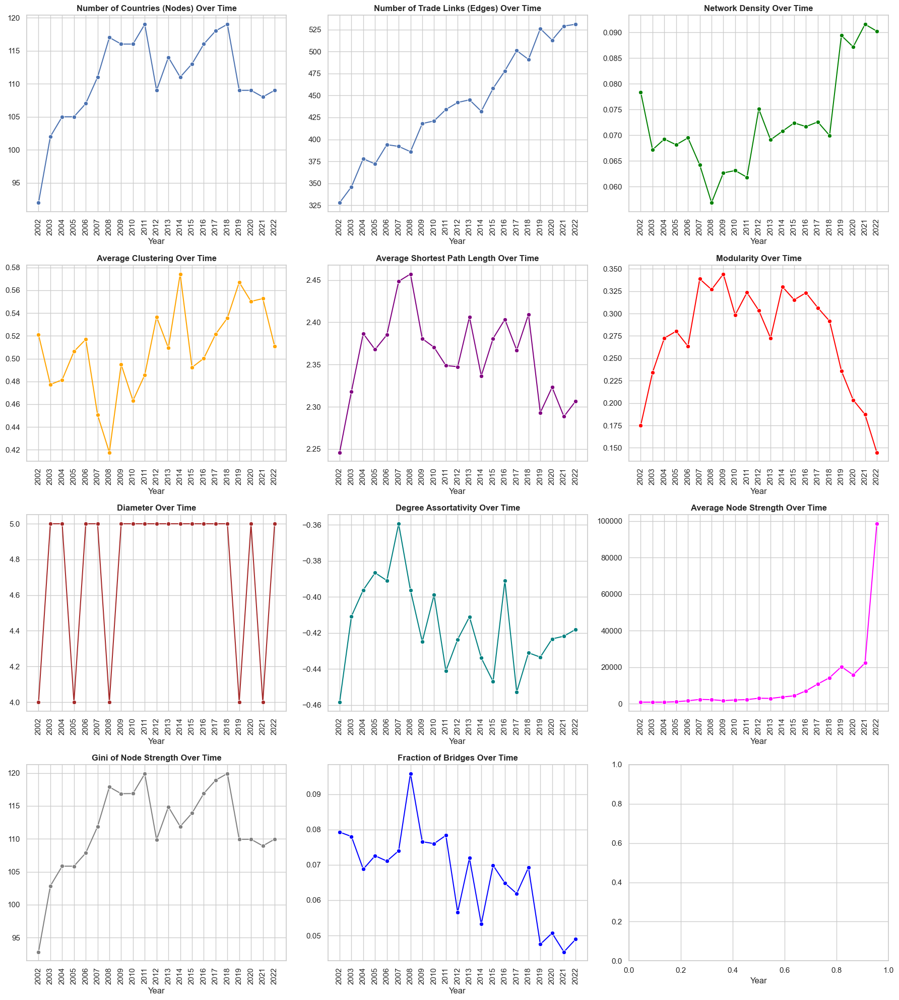

In [31]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import networkx as nx
from community import community_louvain

df_lithium = df.filter(pl.col("k") == 282520).to_pandas()

years = sorted(df_lithium['t'].unique())

##############################################
# Building Yearly Graphs
##############################################
yearly_graphs = {}
for y in years:
    df_year = df_lithium[df_lithium['t'] == y]
    df_agg = df_year.groupby(['export_country','import_country'], as_index=False)['v'].sum()
    G = nx.Graph()
    for _, row in df_agg.iterrows():
        exporter = row['export_country']
        importer = row['import_country']
        value = row['v']
        if exporter != importer:
            if G.has_edge(exporter, importer):
                G[exporter][importer]['weight'] += value
            else:
                G.add_edge(exporter, importer, weight=value)
    yearly_graphs[y] = G

##############################################
# Helper Functions
##############################################
def compute_diameter(G):
    if G.number_of_nodes() == 0:
        return np.nan
    if nx.is_connected(G):
        return nx.diameter(G)
    else:
        GCC = max(nx.connected_components(G), key=len)
        G_sub = G.subgraph(GCC)
        if G_sub.number_of_nodes() > 1:
            return nx.diameter(G_sub)
        else:
            return 0.0

def compute_degree_assortativity(G):
    if G.number_of_edges() > 0:
        return nx.degree_assortativity_coefficient(G, x='degree')
    else:
        return np.nan

def compute_avg_node_strength(G):
    if G.number_of_nodes() == 0:
        return np.nan
    strengths = []
    for n in G.nodes():
        strength = sum(d['weight'] for _,_,d in G.edges(n, data=True))
        strengths.append(strength)
    if len(strengths) > 0:
        return np.mean(strengths)
    else:
        return np.nan

def gini_coefficient(values):
    arr = np.sort(values)
    n = len(arr)
    if n == 0:
        return np.nan

    cumulative = np.cumsum(arr)
    sum_arr = cumulative[-1]
    if sum_arr == 0:
        return 0.0

    rel_cumulative = cumulative / sum_arr
    return (n+1 - 2*np.sum(rel_cumulative)/n)

def compute_gini_node_strength(G):
    if G.number_of_nodes() == 0:
        return np.nan
    strengths = [sum(d['weight'] for _,_,d in G.edges(n, data=True)) for n in G.nodes()]
    if len(strengths) == 0:
        return np.nan
    return gini_coefficient(strengths)

def compute_fraction_bridges(G):
    if G.number_of_edges() == 0:
        return 0.0
    bridges = list(nx.bridges(G))
    return len(bridges) / G.number_of_edges()

##############################################
# Network Metrics Over Time
##############################################
results = {
    'year': [],
    'num_nodes': [],
    'num_edges': [],
    'density': [],
    'avg_clustering': [],
    'avg_shortest_path': [],
    'modularity': [],
    'num_communities': [],
    'diameter': [],
    'degree_assortativity': [],
    'avg_node_strength': [],
    'gini_node_strength': [],
    'fraction_bridges': []
}

for y, G in yearly_graphs.items():
    num_nodes = G.number_of_nodes()
    num_edges = G.number_of_edges()

    density = nx.density(G)

    # Average Clustering Coefficient
    avg_clustering = nx.average_clustering(G)
    
    # Average shortest path length
    if nx.is_connected(G):
        avg_sp = nx.average_shortest_path_length(G)
    else:
        GCC = max(nx.connected_components(G), key=len)
        G_sub = G.subgraph(GCC)
        avg_sp = nx.average_shortest_path_length(G_sub)

    # Community Detection
    partition = community_louvain.best_partition(G, weight='weight')
    mod = community_louvain.modularity(partition, G, weight='weight')
    num_com = len(set(partition.values()))
    
    # Diameter
    diameter = compute_diameter(G)
    
    # Degree Assortativity
    degree_assort = compute_degree_assortativity(G)
    
    # Average Node Strength
    avg_strength = compute_avg_node_strength(G)
    
    # Gini Coefficient of Node Strength
    gini_strength = compute_gini_node_strength(G)
    
    # Fraction Bridges
    frac_bridges = compute_fraction_bridges(G)
    
    results['year'].append(y)
    results['num_nodes'].append(num_nodes)
    results['num_edges'].append(num_edges)
    results['density'].append(density)
    results['avg_clustering'].append(avg_clustering)
    results['avg_shortest_path'].append(avg_sp)
    results['modularity'].append(mod)
    results['num_communities'].append(num_com)
    results['diameter'].append(diameter)
    results['degree_assortativity'].append(degree_assort)
    results['avg_node_strength'].append(avg_strength)
    results['gini_node_strength'].append(gini_strength)
    results['fraction_bridges'].append(frac_bridges)

results_df = pd.DataFrame(results)

##############################################
# Visualization
##############################################
sns.set_theme(style="whitegrid")

fig, axs = plt.subplots(4, 3, figsize=(18, 20))
axs = axs.flatten()

sns.lineplot(data=results_df, x='year', y='num_nodes', ax=axs[0], marker='o')
axs[0].set_title("Number of Countries (Nodes) Over Time", fontweight="bold")
axs[0].set_xticks(results_df["year"].unique().astype(int))
axs[0].tick_params(axis='x', labelrotation=90)

sns.lineplot(data=results_df, x='year', y='num_edges', ax=axs[1], marker='o')
axs[1].set_title("Number of Trade Links (Edges) Over Time", fontweight="bold")
axs[1].set_xticks(results_df["year"].unique().astype(int))
axs[1].tick_params(axis='x', labelrotation=90)

sns.lineplot(data=results_df, x='year', y='density', ax=axs[2], marker='o', color='green')
axs[2].set_title("Network Density Over Time", fontweight="bold")
axs[2].set_xticks(results_df["year"].unique().astype(int))
axs[2].tick_params(axis='x', labelrotation=90)

sns.lineplot(data=results_df, x='year', y='avg_clustering', ax=axs[3], marker='o', color='orange')
axs[3].set_title("Average Clustering Over Time", fontweight="bold")
axs[3].set_xticks(results_df["year"].unique().astype(int))
axs[3].tick_params(axis='x', labelrotation=90)

sns.lineplot(data=results_df, x='year', y='avg_shortest_path', ax=axs[4], marker='o', color='purple')
axs[4].set_title("Average Shortest Path Length Over Time", fontweight="bold")
axs[4].set_xticks(results_df["year"].unique().astype(int))
axs[4].tick_params(axis='x', labelrotation=90)

sns.lineplot(data=results_df, x='year', y='modularity', ax=axs[5], marker='o', color='red')
axs[5].set_title("Modularity Over Time", fontweight="bold")
axs[5].set_xticks(results_df["year"].unique().astype(int))
axs[5].tick_params(axis='x', labelrotation=90)

sns.lineplot(data=results_df, x='year', y='diameter', ax=axs[6], marker='o', color='brown')
axs[6].set_title("Diameter Over Time", fontweight="bold")
axs[6].set_xticks(results_df["year"].unique().astype(int))
axs[6].tick_params(axis='x', labelrotation=90)

sns.lineplot(data=results_df, x='year', y='degree_assortativity', ax=axs[7], marker='o', color='teal')
axs[7].set_title("Degree Assortativity Over Time", fontweight="bold")
axs[7].set_xticks(results_df["year"].unique().astype(int))
axs[7].tick_params(axis='x', labelrotation=90)

sns.lineplot(data=results_df, x='year', y='avg_node_strength', ax=axs[8], marker='o', color='magenta')
axs[8].set_title("Average Node Strength Over Time", fontweight="bold")
axs[8].set_xticks(results_df["year"].unique().astype(int))
axs[8].tick_params(axis='x', labelrotation=90)

sns.lineplot(data=results_df, x='year', y='gini_node_strength', ax=axs[9], marker='o', color='gray')
axs[9].set_title("Gini of Node Strength Over Time", fontweight="bold")
axs[9].set_xticks(results_df["year"].unique().astype(int))
axs[9].tick_params(axis='x', labelrotation=90)

sns.lineplot(data=results_df, x='year', y='fraction_bridges', ax=axs[10], marker='o', color='blue')
axs[10].set_title("Fraction of Bridges Over Time", fontweight="bold")
axs[10].set_xticks(results_df["year"].unique().astype(int))
axs[10].tick_params(axis='x', labelrotation=90)

for ax in axs:
    ax.set_xlabel("Year")
    ax.set_ylabel("")
    ax.grid(True)

plt.tight_layout()
plt.show()

### Community Stability Over Time

Community Stability Over Time (NMI):
 [(2002, 2003, 0.3079150943303561), (2003, 2004, 0.127433212791437), (2004, 2005, 0.15852141133425693), (2005, 2006, 0.20095986472988245), (2006, 2007, 0.3583749898749134), (2007, 2008, 0.23094676138435313), (2008, 2009, 0.25629939865799994), (2009, 2010, 0.24433396536145646), (2010, 2011, 0.17601412779624925), (2011, 2012, 0.3138231464011897), (2012, 2013, 0.31761557671717344), (2013, 2014, 0.35303769213539576), (2014, 2015, 0.37476888011586296), (2015, 2016, 0.20670542445634438), (2016, 2017, 0.13896364567167538), (2017, 2018, 0.25383326750335006), (2018, 2019, 0.21884726014809894), (2019, 2020, 0.17097193707074496), (2020, 2021, 0.20370925003413712), (2021, 2022, 0.20865752985546424)]


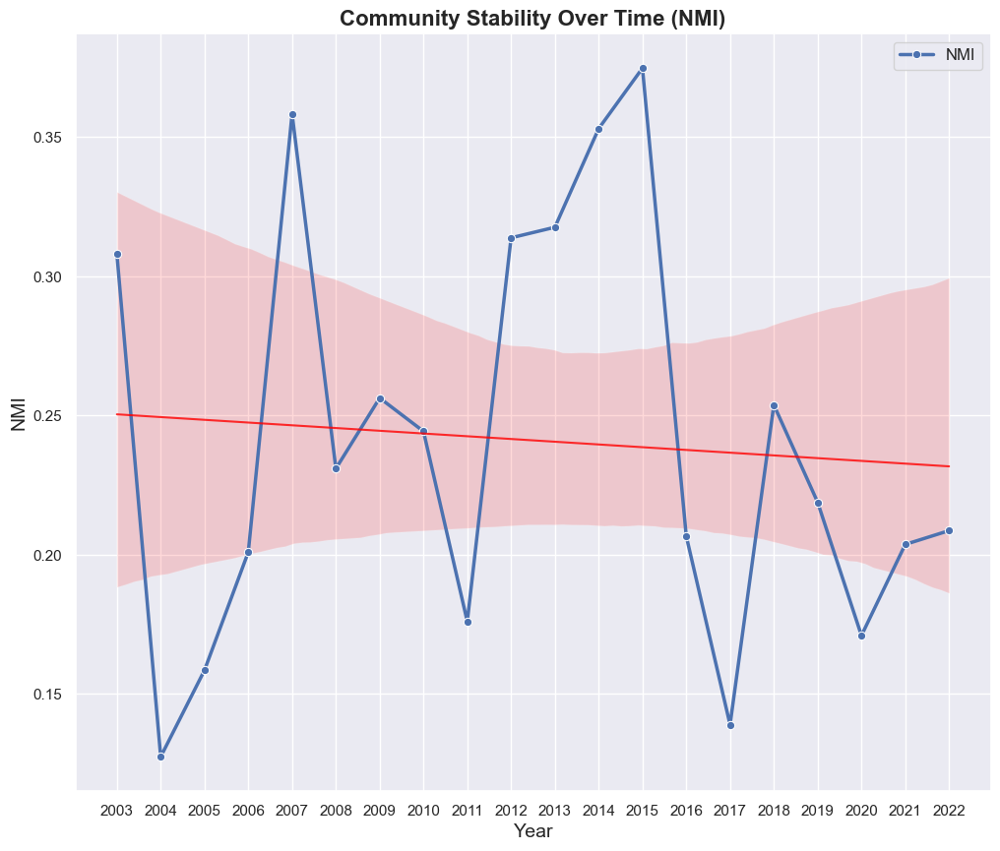

In [32]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import networkx as nx
from networkx.algorithms.community import greedy_modularity_communities
from sklearn.metrics.cluster import normalized_mutual_info_score

##############################################
# Data Loading
##############################################
cc_df = loader.country_codes.to_pandas() 
country_code_to_name = dict(zip(cc_df["country_code"], cc_df["country_name"]))
country_code_to_iso3 = dict(zip(cc_df["country_code"], cc_df["country_iso3"]))

##############################################
# Communities Per Year
##############################################
year_communities = {}
for y, G in yearly_graphs.items():
    comms = greedy_modularity_communities(G, weight='weight')
    node2comm = {}
    for i, cset in enumerate(comms):
        for node in cset:
            node2comm[node] = i
    year_communities[y] = node2comm

##############################################
# Year-to-Year Community Stability (NMI)
##############################################
years_sorted = sorted(yearly_graphs.keys())
stability_results = []
for i in range(len(years_sorted)-1):
    y1, y2 = years_sorted[i], years_sorted[i+1]
    common_nodes = set(year_communities[y1].keys()).intersection(year_communities[y2].keys())
    c1 = [year_communities[y1][n] for n in common_nodes]
    c2 = [year_communities[y2][n] for n in common_nodes]
    nmi = normalized_mutual_info_score(c1, c2)
    stability_results.append((y1, y2, nmi))

print("Community Stability Over Time (NMI):\n", stability_results)

##############################################
# Visualization
##############################################
nmi_df = pd.DataFrame(stability_results, columns=['year_start', 'year_end', 'NMI'])
nmi_df['year'] = nmi_df['year_end']

plt.figure(figsize=(12, 10))
sns.set_theme(style="darkgrid")

sns.lineplot(x='year', y='NMI', data=nmi_df, marker='o', linewidth=2.5, label='NMI')
sns.regplot(x='year', y='NMI', data=nmi_df, scatter=False, 
            line_kws={'color': 'red', 'lw': 1.5, 'alpha':0.8})

plt.title("Community Stability Over Time (NMI)", fontsize=16, fontweight='bold')
plt.xlabel("Year", fontsize=14)
plt.xticks(nmi_df["year"].unique().astype(int))
plt.ylabel("NMI", fontsize=14)
plt.legend(fontsize=12)

Intra-Community Trade Ratio Over Time:
 [(2002, 0.5767354563241525), (2003, 0.580190733133207), (2004, 0.6126494858191425), (2005, 0.6361511820818214), (2006, 0.5321130316333584), (2007, 0.6607941757234326), (2008, 0.6038212613898888), (2009, 0.6160040771563469), (2010, 0.6557791668107102), (2011, 0.6670712861049807), (2012, 0.6649195610651842), (2013, 0.6247132223165967), (2014, 0.59430349478764), (2015, 0.5943208750939316), (2016, 0.6430614896304023), (2017, 0.6963090070039022), (2018, 0.7155275630364042), (2019, 0.8714628602239763), (2020, 0.8185099623735703), (2021, 0.7979872442987744), (2022, 0.8580488660995781)]


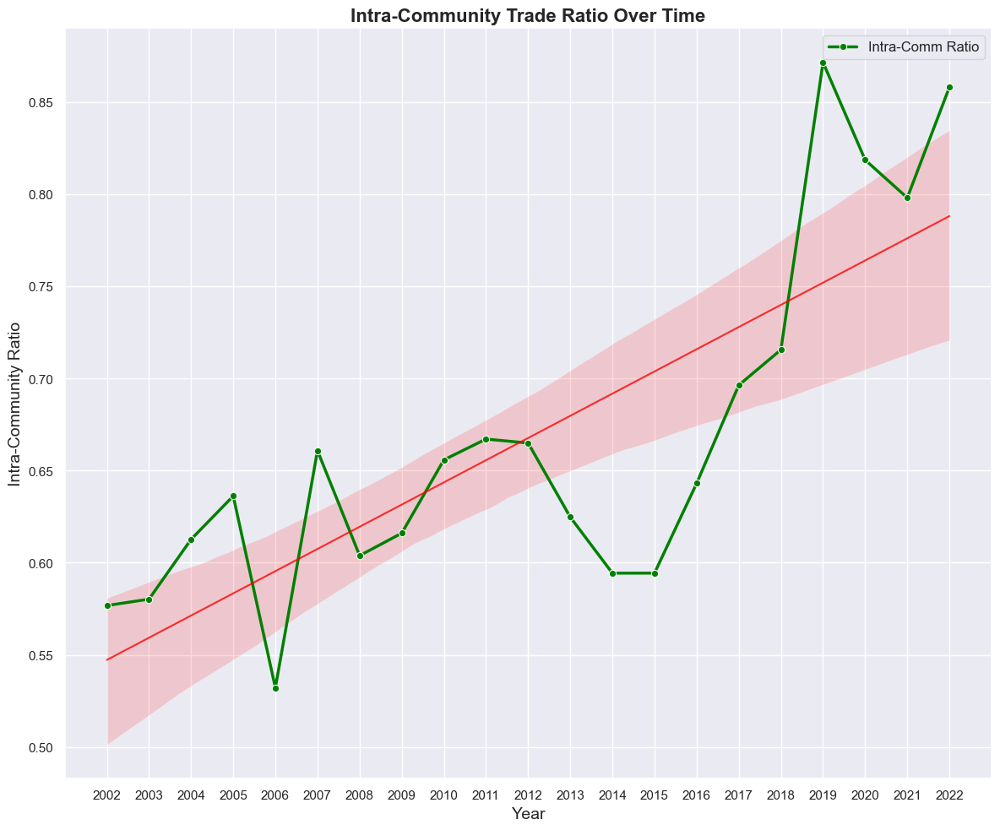

In [33]:
##############################################
# Compute Intra-Community Trade Ratio per Year
##############################################
intra_ratios = []
for y, G in yearly_graphs.items():
    comm_map = year_communities[y]
    intra_weight = 0.0
    inter_weight = 0.0

    for u, v, d in G.edges(data=True):
        if comm_map.get(u) == comm_map.get(v):
            intra_weight += d.get('weight', 0)
        else:
            inter_weight += d.get('weight', 0)

    total_weight = intra_weight + inter_weight
    if total_weight > 0:
        ratio = intra_weight / total_weight
        intra_ratios.append((y, ratio))

print("Intra-Community Trade Ratio Over Time:\n", intra_ratios)

intra_df = pd.DataFrame(intra_ratios, columns=['year', 'intra_ratio'])

##############################################
# Visualization
##############################################
plt.figure(figsize=(12, 10))
sns.set_theme(style="darkgrid")
sns.lineplot(x='year', y='intra_ratio', data=intra_df, marker='o', linewidth=2.5, color='green', label='Intra-Comm Ratio')
sns.regplot(x='year', y='intra_ratio', data=intra_df, scatter=False, 
            line_kws={'color': 'red', 'lw': 1.5, 'alpha':0.8})

plt.title("Intra-Community Trade Ratio Over Time", fontsize=16, fontweight='bold')
plt.xlabel("Year", fontsize=14)
plt.xticks(intra_df["year"].unique().astype(int))
plt.ylabel("Intra-Community Ratio", fontsize=14)
plt.legend(fontsize=12)

plt.tight_layout()
plt.show()

### Community Detection

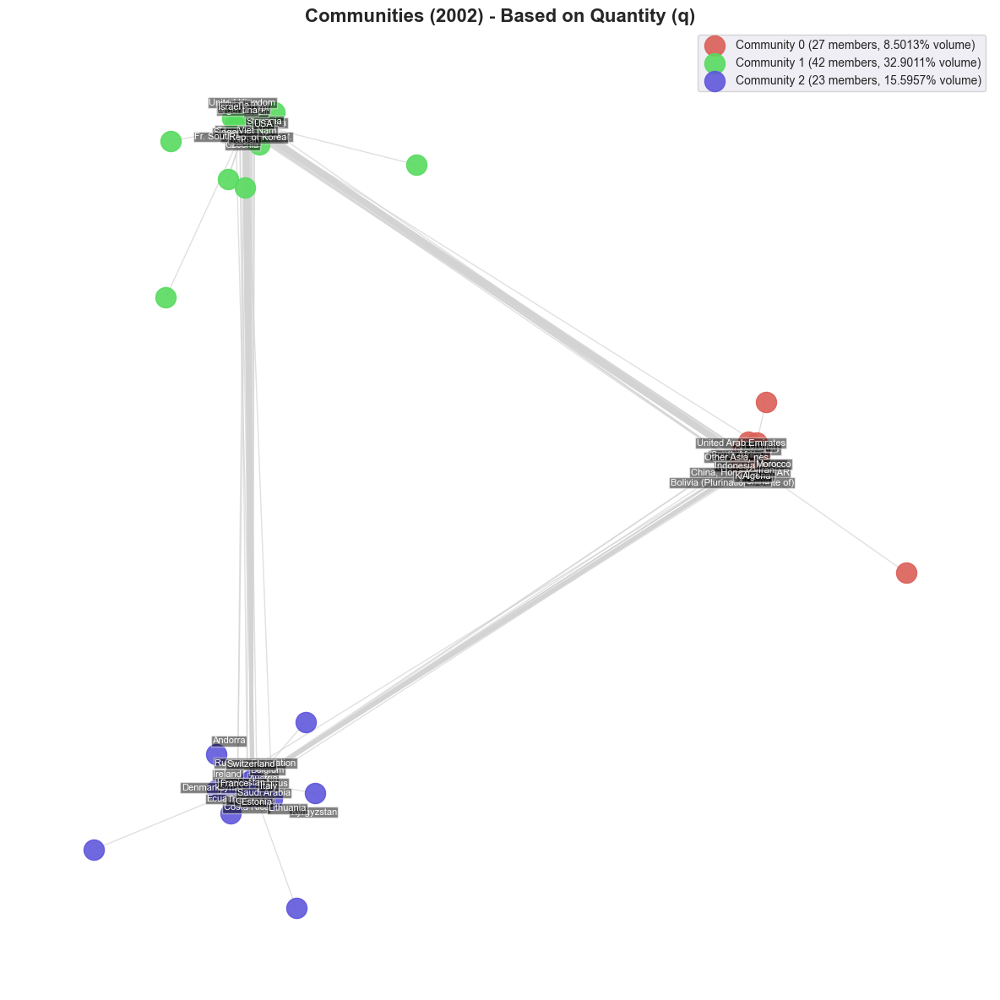

Top Countries by Community based on q:
Community 0:
  China | Netherlands | Spain | South Africa | Sweden | Australia | Other Asia, nes | Mexico | Türkiye | China, Hong Kong SAR | Indonesia | Tunisia | United Arab Emirates | Iran | Peru | Algeria | Greece | Morocco | Bolivia (Plurinational State of) | Kenya
Community 1:
  USA | Japan | India | United Kingdom | Rep. of Korea | Malaysia | Canada | Singapore | Poland | Ukraine | Slovenia | Egypt | Argentina | Fr. South Antarctic Terr. | Israel | Colombia | Finland | Czechia | Viet Nam | Brazil
Community 2:
  Belgium | Russian Federation | Germany | France | Italy | Thailand | Switzerland | Estonia | Saudi Arabia | Austria | Belarus | Syria | Kazakhstan | Ireland | Ecuador | Lithuania | Denmark | Costa Rica | Andorra | Kyrgyzstan


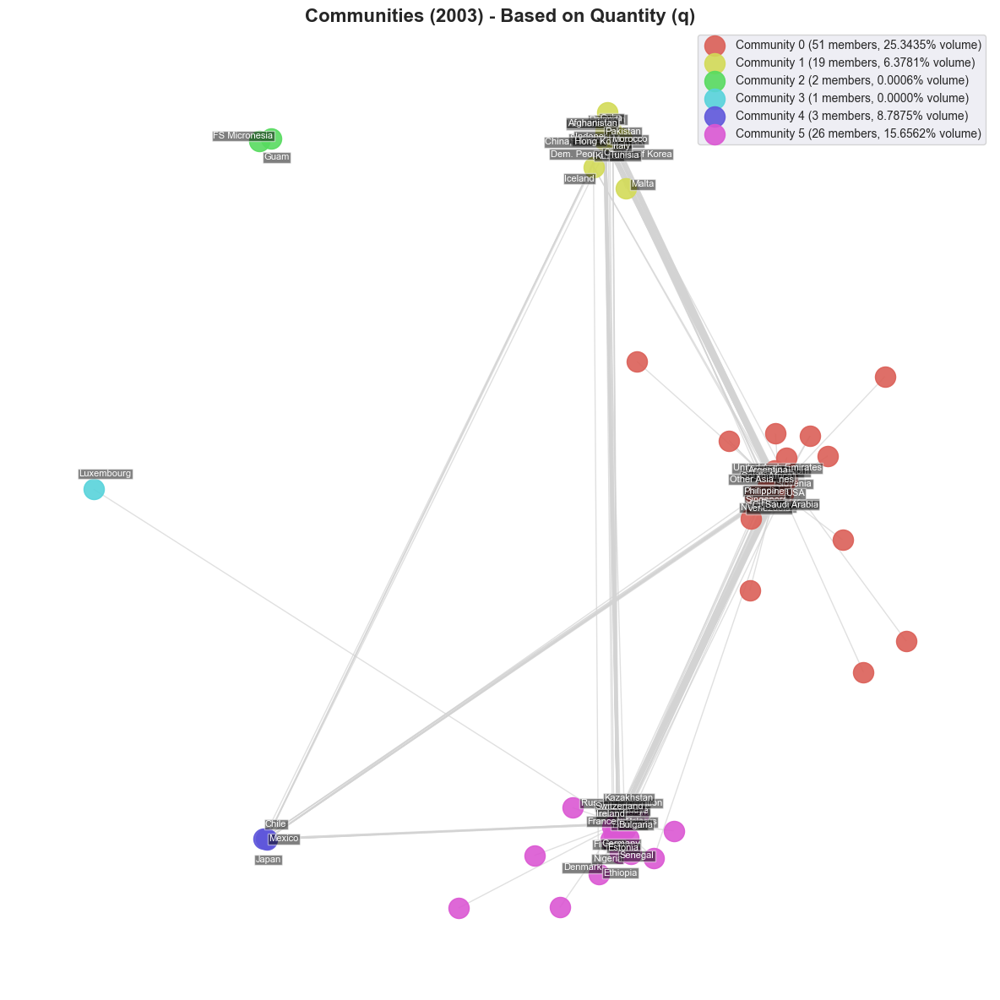

Top Countries by Community based on q:
Community 0:
  USA | India | United Kingdom | South Africa | Rep. of Korea | Australia | New Zealand | United Arab Emirates | Canada | Singapore | Saudi Arabia | Other Asia, nes | Thailand | Argentina | Slovenia | Egypt | Israel | Czechia | Venezuela | Philippines
Community 1:
  China | Netherlands | Spain | Italy | Sweden | Ukraine | Poland | Iran | China, Hong Kong SAR | Pakistan | Cuba | Kuwait | Indonesia | Morocco | Tunisia | Afghanistan | Dem. People's Rep. of Korea | Iceland | Malta
Community 2:
  Guam | FS Micronesia
Community 3:
  Luxembourg
Community 4:
  Japan | Mexico | Chile
Community 5:
  Belgium | Germany | Russian Federation | France | Switzerland | Türkiye | Estonia | Greece | Austria | Finland | Bulgaria | Ireland | Belarus | Portugal | Nigeria | Senegal | Kazakhstan | Ethiopia | Syria | Denmark


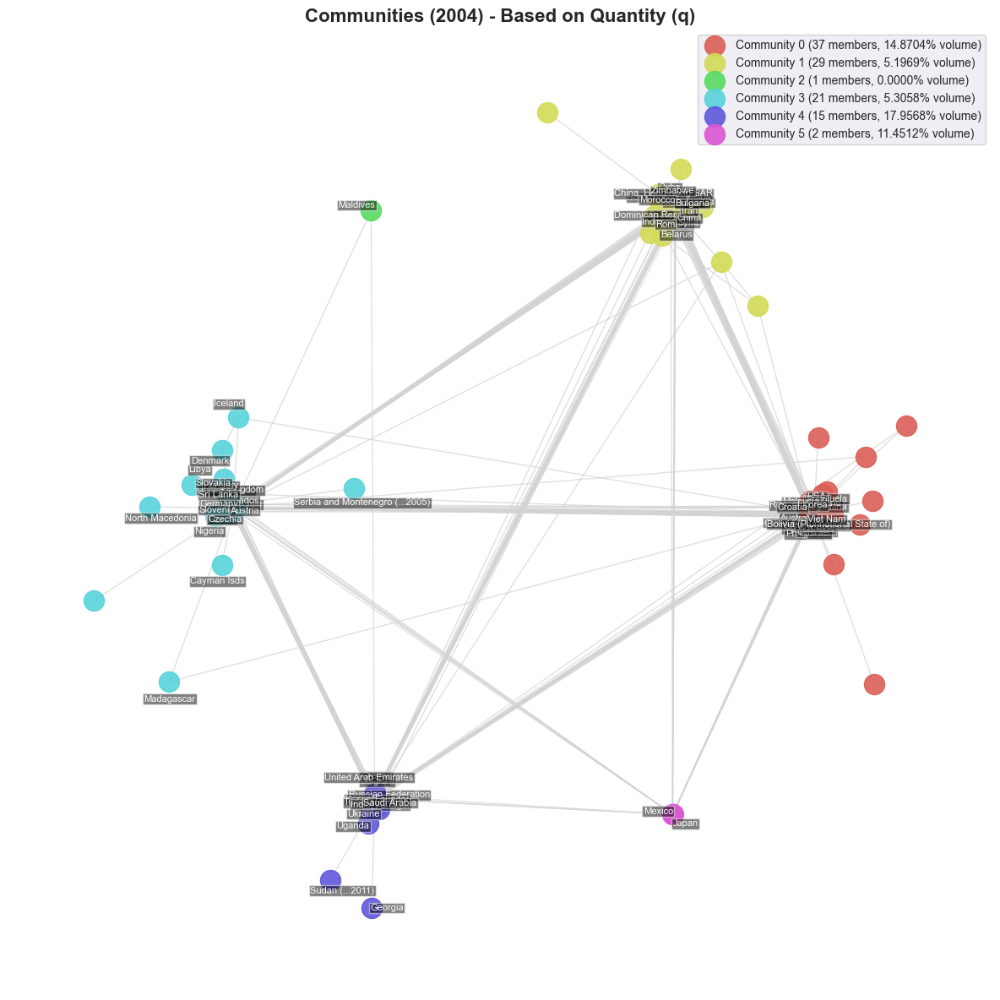

Top Countries by Community based on q:
Community 0:
  USA | Malaysia | Rep. of Korea | Canada | Australia | Argentina | New Zealand | Thailand | Other Asia, nes | Singapore | Egypt | Viet Nam | Philippines | Colombia | Venezuela | Brazil | Israel | Pakistan | Croatia | Bolivia (Plurinational State of)
Community 1:
  China | Netherlands | Spain | South Africa | Poland | Sweden | Jordan | Romania | Indonesia | Iran | China, Hong Kong SAR | Morocco | Cuba | Belarus | Syria | Algeria | Zimbabwe | Bulgaria | Bosnia Herzegovina | Dominican Rep.
Community 2:
  Maldives
Community 3:
  Germany | United Kingdom | France | Slovenia | Switzerland | Chile | Czechia | Barbados | Austria | Hungary | Slovakia | Nigeria | Sri Lanka | Libya | Denmark | Cayman Isds | Iceland | North Macedonia | Serbia and Montenegro (...2005) | Madagascar
Community 4:
  Belgium | Russian Federation | India | Türkiye | Italy | Saudi Arabia | Ukraine | United Arab Emirates | Greece | Kenya | Portugal | Ecuador | Uganda | S

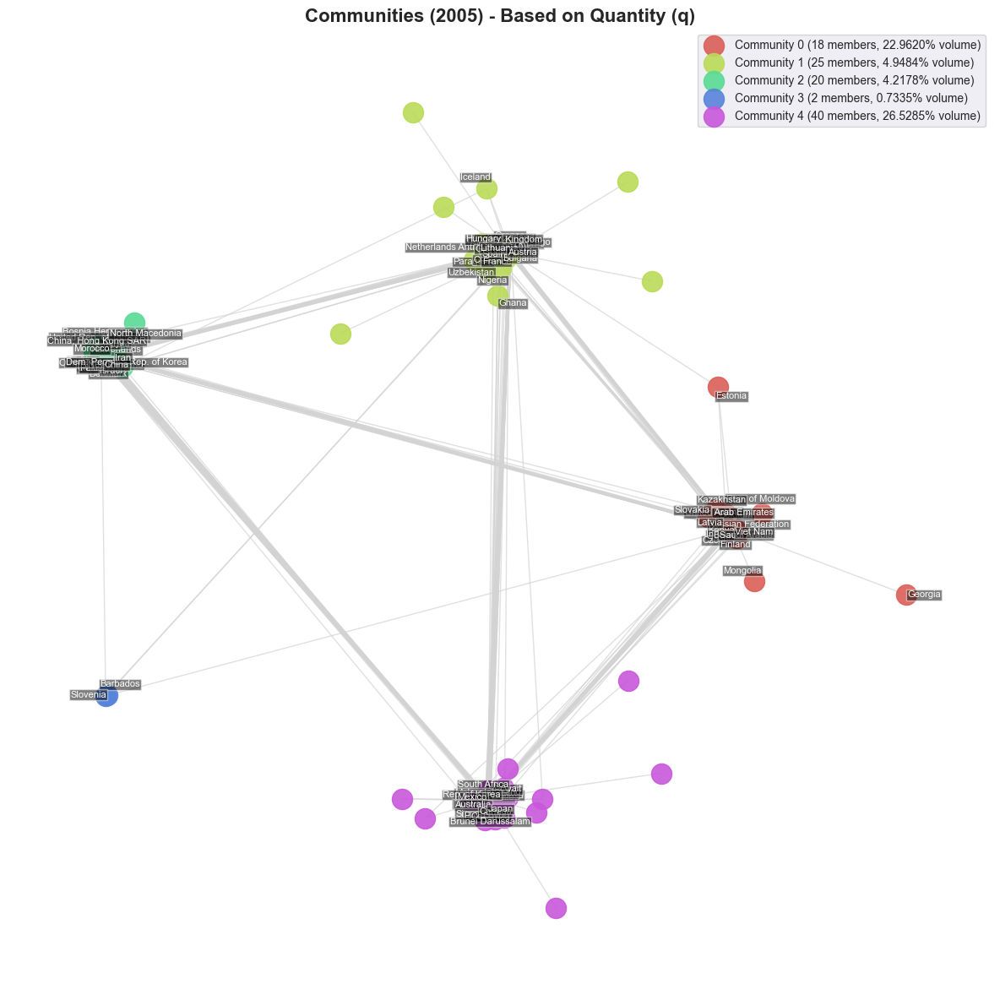

Top Countries by Community based on q:
Community 0:
  Belgium | Russian Federation | India | Poland | United Arab Emirates | Saudi Arabia | Viet Nam | Czechia | Finland | Belarus | Kenya | Kazakhstan | Slovakia | Latvia | Rep. of Moldova | Mongolia | Estonia | Georgia
Community 1:
  Germany | Spain | France | United Kingdom | Switzerland | Greece | Andorra | Austria | Trinidad and Tobago | Croatia | Portugal | Bulgaria | Hungary | Nigeria | Lithuania | Uzbekistan | Paraguay | Netherlands Antilles (...2010) | Ghana | Iceland
Community 2:
  China | Netherlands | Italy | Türkiye | Algeria | Ukraine | Israel | Other Asia, nes | Pakistan | Iran | China, Hong Kong SAR | Morocco | New Zealand | Indonesia | Tunisia | United Rep. of Tanzania | Bosnia Herzegovina | Dem. People's Rep. of Korea | Denmark | North Macedonia
Community 3:
  Barbados | Slovenia
Community 4:
  USA | Japan | Rep. of Korea | Canada | South Africa | Chile | Australia | Argentina | Singapore | Thailand | Mexico | Malaysia |

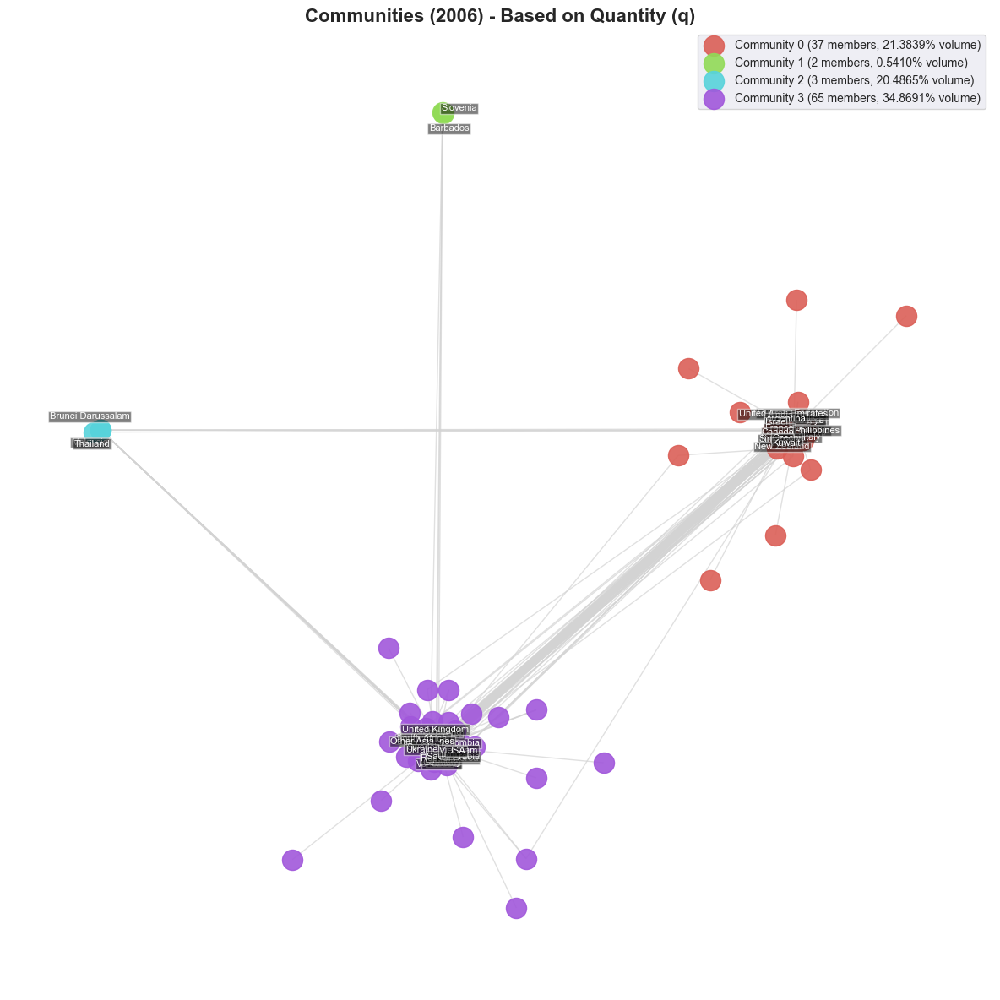

Top Countries by Community based on q:
Community 0:
  Chile | Belgium | Russian Federation | India | Canada | France | Türkiye | Italy | Argentina | Singapore | Poland | United Arab Emirates | Mexico | Philippines | Czechia | Indonesia | Israel | Kuwait | New Zealand | Belarus
Community 1:
  Slovenia | Barbados
Community 2:
  Malaysia | Thailand | Brunei Darussalam
Community 3:
  USA | Japan | China | Germany | Netherlands | Spain | United Kingdom | Rep. of Korea | South Africa | Other Asia, nes | Switzerland | Sweden | Australia | Egypt | Saudi Arabia | Iran | Venezuela | Colombia | Ukraine | Viet Nam


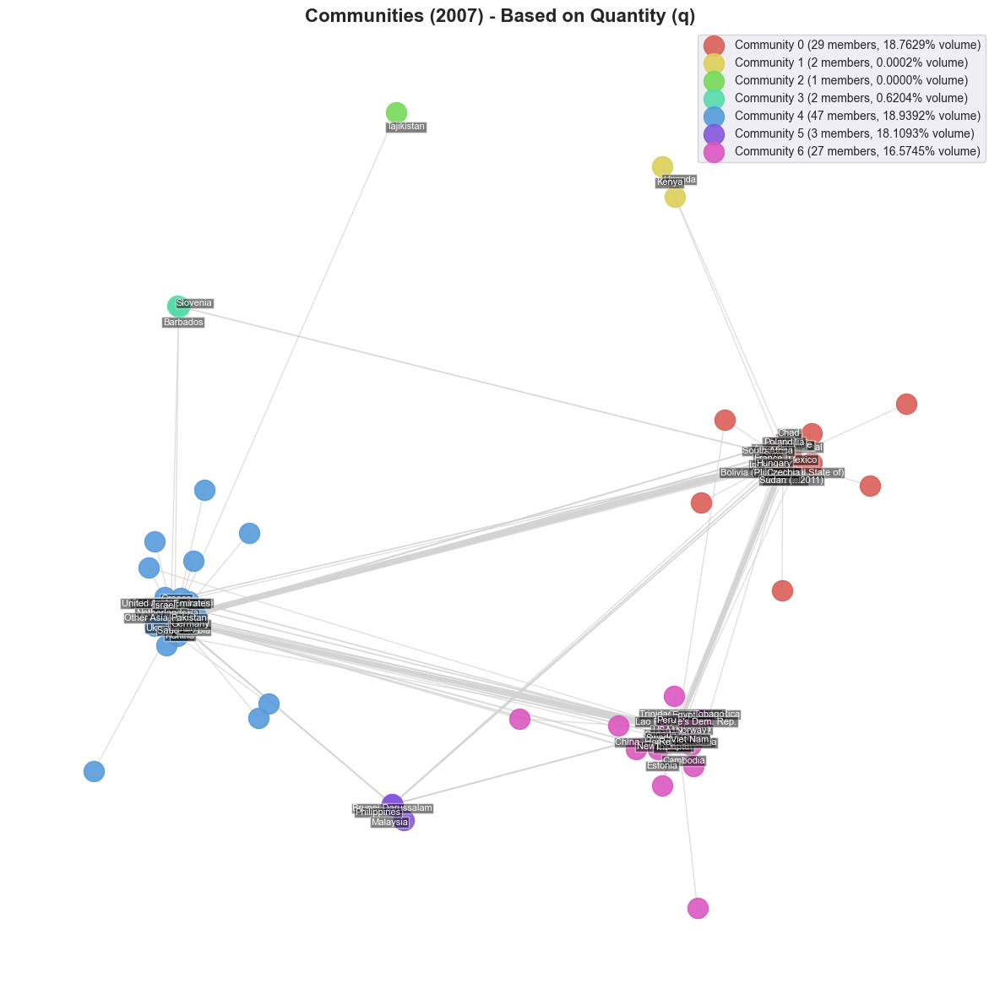

Top Countries by Community based on q:
Community 0:
  Chile | Belgium | Spain | Türkiye | France | South Africa | Poland | Argentina | Mexico | Australia | Singapore | Syria | Indonesia | Czechia | Venezuela | Sudan (...2011) | Hungary | Portugal | Bolivia (Plurinational State of) | Chad
Community 1:
  Kenya | Uganda
Community 2:
  Tajikistan
Community 3:
  Slovenia | Barbados
Community 4:
  China | Germany | India | Netherlands | Russian Federation | United Kingdom | Italy | Switzerland | United Arab Emirates | Ukraine | Other Asia, nes | Iran | Saudi Arabia | Greece | Kuwait | Pakistan | Brazil | Morocco | Austria | Israel
Community 5:
  Philippines | Malaysia | Brunei Darussalam
Community 6:
  USA | Japan | Rep. of Korea | Canada | Thailand | China, Hong Kong SAR | Colombia | Egypt | Sweden | New Zealand | Ghana | Viet Nam | Norway | Peru | Lao People's Dem. Rep. | Trinidad and Tobago | Ecuador | Cambodia | Costa Rica | Estonia


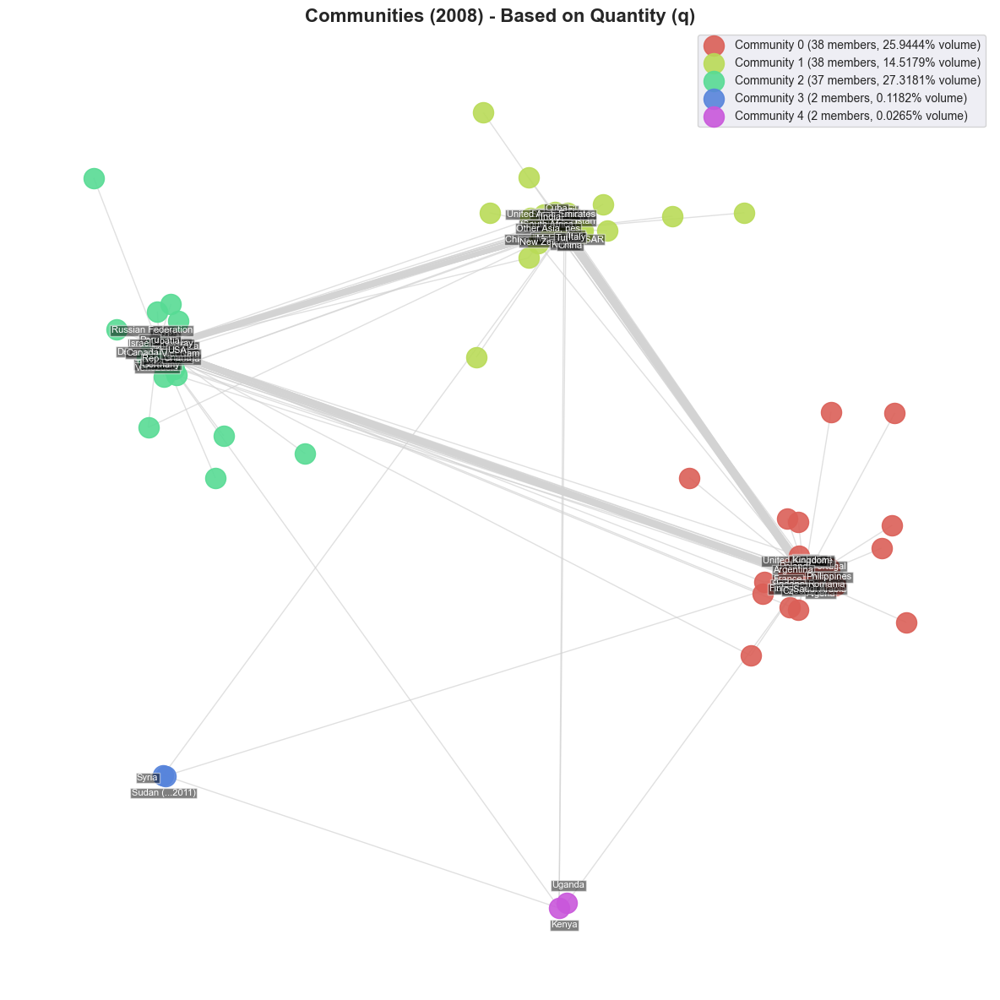

Top Countries by Community based on q:
Community 0:
  Chile | Belgium | Spain | Türkiye | United Kingdom | France | Argentina | Mexico | Saudi Arabia | Australia | Sweden | Singapore | Algeria | Poland | Philippines | Czechia | Indonesia | Portugal | Romania | Finland
Community 1:
  China | India | Netherlands | South Africa | United Arab Emirates | Italy | Switzerland | Other Asia, nes | Ukraine | Brazil | Kuwait | China, Hong Kong SAR | Iran | Malaysia | Greece | Cuba | Tunisia | Pakistan | Belarus | New Zealand
Community 2:
  USA | Japan | Germany | Russian Federation | Rep. of Korea | Canada | Thailand | Slovenia | Colombia | Egypt | Venezuela | Ghana | Viet Nam | Israel | Austria | Norway | Peru | Costa Rica | Denmark | Croatia
Community 3:
  Sudan (...2011) | Syria
Community 4:
  Kenya | Uganda


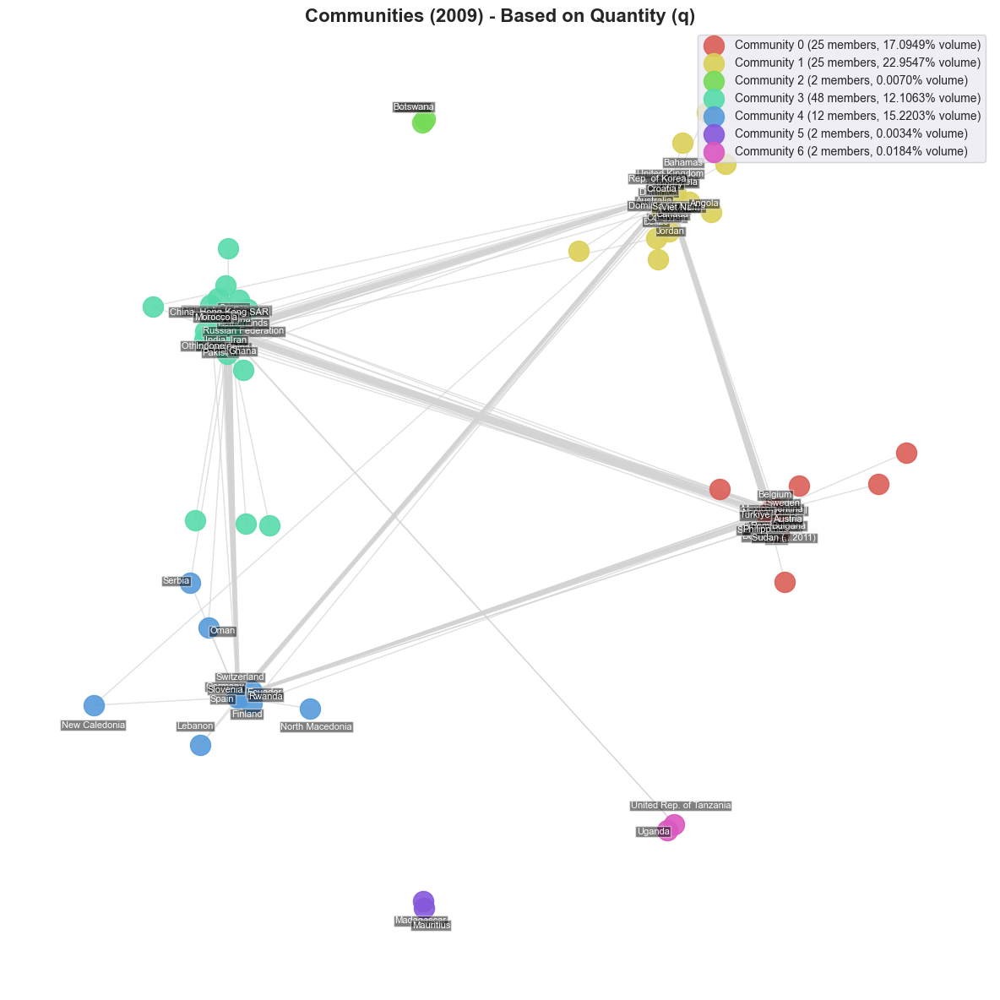

Top Countries by Community based on q:
Community 0:
  Chile | Belgium | Türkiye | Ukraine | Sweden | Mexico | Argentina | Singapore | Norway | Philippines | Austria | Syria | Czechia | Peru | Sudan (...2011) | Portugal | Bulgaria | Romania | Denmark | Iraq
Community 1:
  USA | Japan | United Kingdom | Rep. of Korea | Thailand | Canada | Saudi Arabia | Australia | Egypt | Venezuela | Colombia | Viet Nam | Dominican Rep. | Hungary | Croatia | Dominica | Angola | Belize | Jordan | Bahamas
Community 2:
  Namibia | Botswana
Community 3:
  China | India | Netherlands | France | Russian Federation | South Africa | Algeria | United Arab Emirates | Poland | Malaysia | Other Asia, nes | Indonesia | Brazil | Italy | Ghana | Iran | China, Hong Kong SAR | Pakistan | Greece | Morocco
Community 4:
  Germany | Switzerland | Spain | Slovenia | Finland | Rwanda | Ecuador | Lebanon | Oman | North Macedonia | Serbia | New Caledonia
Community 5:
  Mauritius | Madagascar
Community 6:
  United Rep. of Tanzan

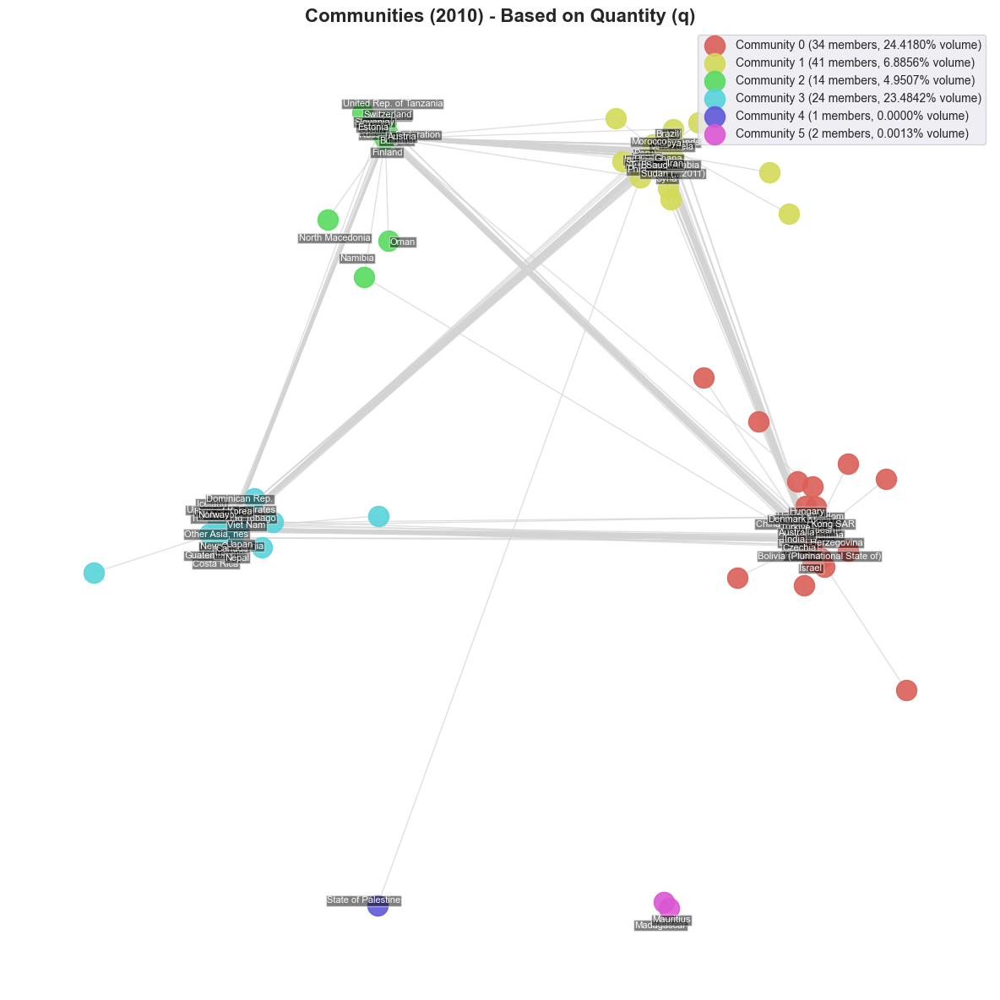

Top Countries by Community based on q:
Community 0:
  Chile | Belgium | India | United Kingdom | Türkiye | South Africa | Argentina | Australia | Poland | Sweden | China, Hong Kong SAR | Czechia | Romania | Israel | Portugal | Bolivia (Plurinational State of) | Hungary | Bangladesh | Denmark | Bosnia Herzegovina
Community 1:
  China | France | Saudi Arabia | Netherlands | Iran | Ukraine | Singapore | Italy | Sudan (...2011) | Libya | Philippines | Brazil | Venezuela | Syria | Indonesia | Peru | Tunisia | Morocco | Ghana | Belarus
Community 2:
  Germany | Spain | Russian Federation | Switzerland | Slovenia | Bulgaria | Austria | Finland | United Rep. of Tanzania | Ecuador | Estonia | Oman | North Macedonia | Namibia
Community 3:
  USA | Japan | Rep. of Korea | Other Asia, nes | Canada | Thailand | Mexico | United Arab Emirates | Egypt | Ireland | Colombia | Norway | Viet Nam | New Caledonia | Nepal | Trinidad and Tobago | Iceland | Costa Rica | Guatemala | Dominican Rep.
Community 4:
  

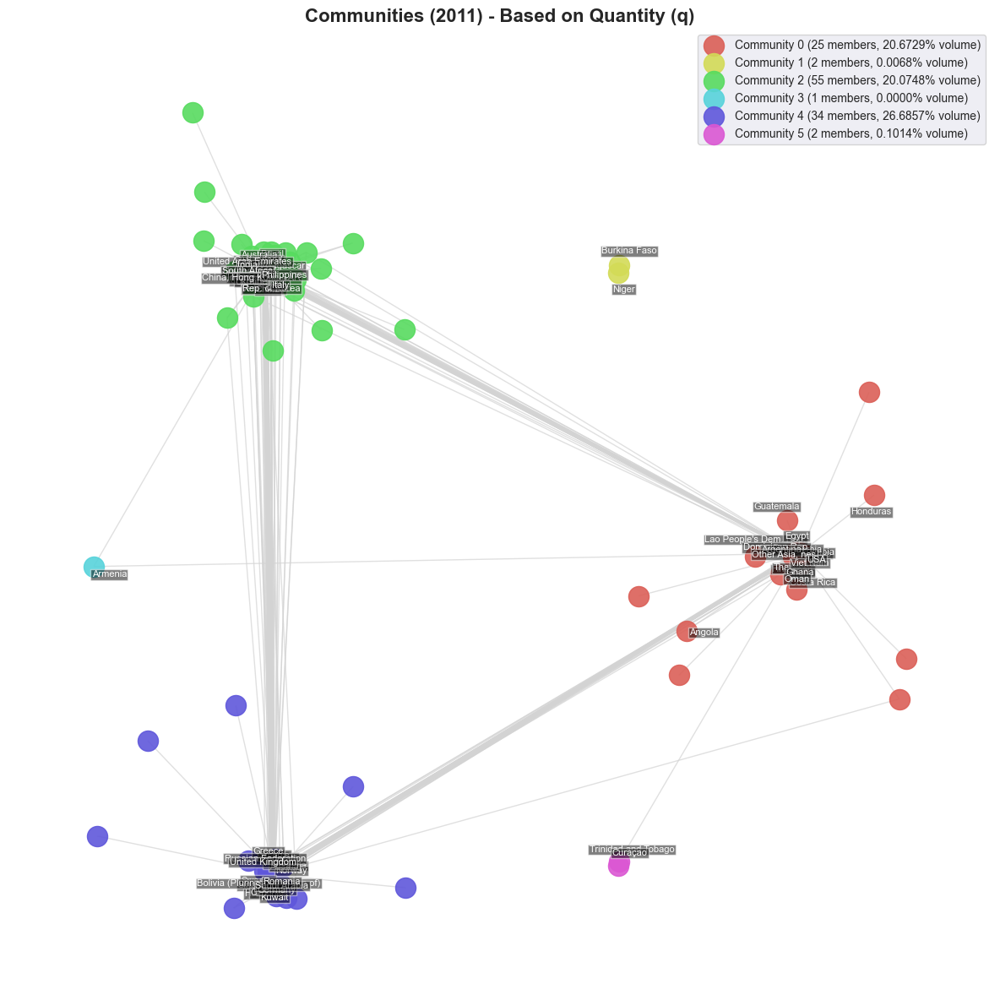

Top Countries by Community based on q:
Community 0:
  USA | Japan | Mexico | Other Asia, nes | Thailand | Argentina | Egypt | Viet Nam | Colombia | Finland | Dominican Rep. | Ghana | Peru | Serbia | Oman | Guatemala | Costa Rica | Lao People's Dem. Rep. | Honduras | Angola
Community 1:
  Niger | Burkina Faso
Community 2:
  China | India | Rep. of Korea | Netherlands | France | Canada | South Africa | United Arab Emirates | Iran | Australia | Poland | Ukraine | Italy | Indonesia | Switzerland | Philippines | Brazil | Venezuela | China, Hong Kong SAR | Madagascar
Community 3:
  Armenia
Community 4:
  Chile | Belgium | Germany | Russian Federation | Spain | Türkiye | United Kingdom | Saudi Arabia | Sweden | Singapore | Slovenia | Czechia | Norway | Greece | Austria | Romania | Portugal | Bolivia (Plurinational State of) | Hungary | Kuwait
Community 5:
  Trinidad and Tobago | Curaçao


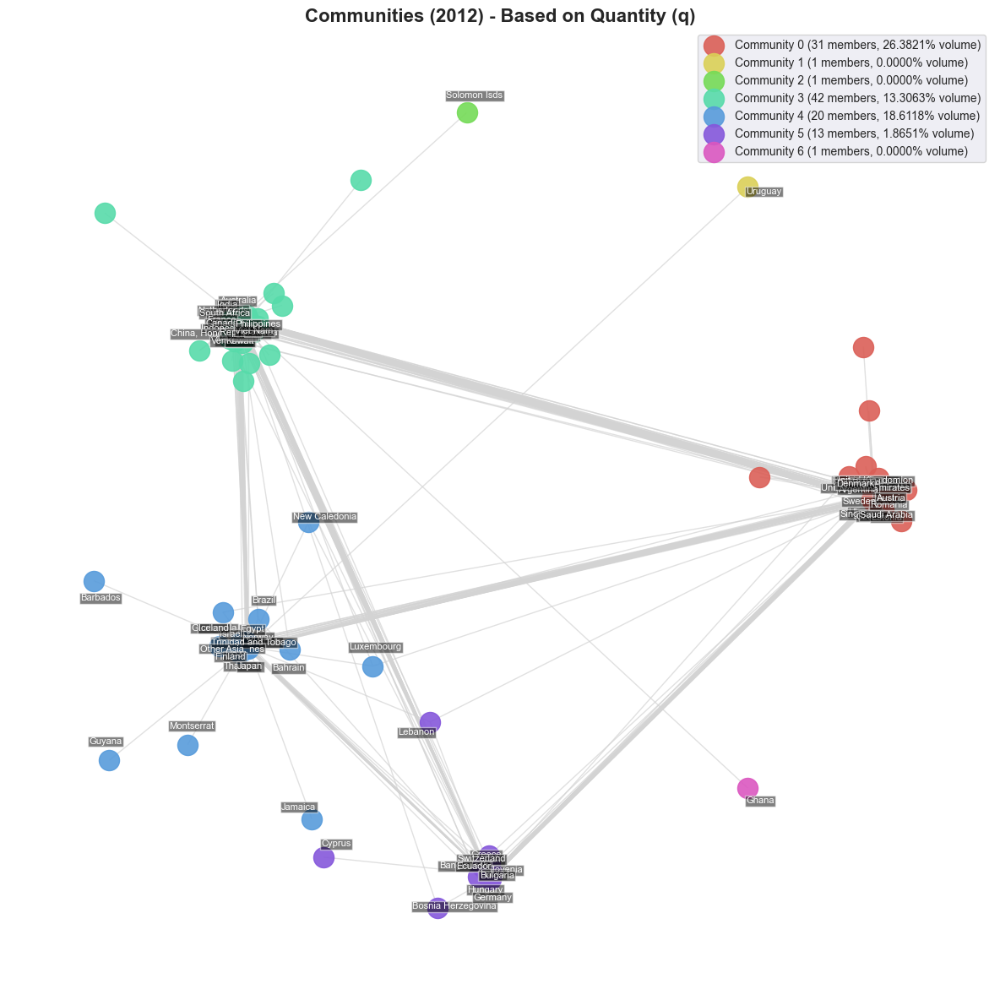

Top Countries by Community based on q:
Community 0:
  Belgium | Chile | Russian Federation | United Kingdom | Türkiye | Sweden | Saudi Arabia | Singapore | United Arab Emirates | Poland | Argentina | Mexico | Ukraine | Czechia | Austria | Portugal | Romania | Estonia | Croatia | Denmark
Community 1:
  Uruguay
Community 2:
  Solomon Isds
Community 3:
  China | India | Rep. of Korea | Canada | Netherlands | France | South Africa | Australia | Italy | Iran | Indonesia | Kuwait | Peru | Malaysia | Venezuela | Philippines | Tunisia | China, Hong Kong SAR | Viet Nam | Syria
Community 4:
  USA | Japan | Other Asia, nes | Thailand | Egypt | Colombia | Israel | Norway | Finland | Trinidad and Tobago | Brazil | Guatemala | Iceland | Bahrain | Montserrat | Luxembourg | New Caledonia | Jamaica | Barbados | Guyana
Community 5:
  Germany | Spain | Slovenia | Switzerland | Greece | Hungary | Bulgaria | Bangladesh | Ecuador | Latvia | Bosnia Herzegovina | Lebanon | Cyprus
Community 6:
  Ghana


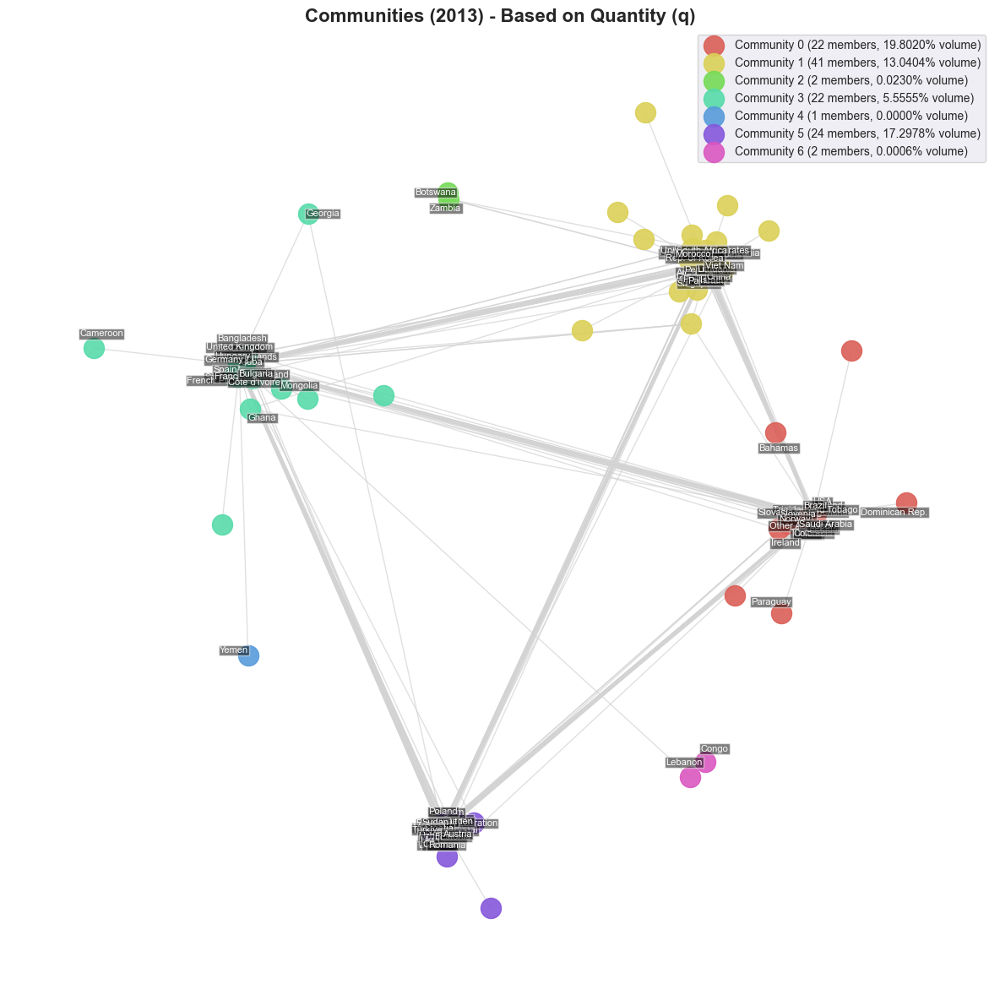

Top Countries by Community based on q:
Community 0:
  USA | Japan | Canada | Other Asia, nes | Thailand | Slovenia | Argentina | Saudi Arabia | Egypt | Nigeria | Colombia | Brazil | Tunisia | Norway | Trinidad and Tobago | Slovakia | Ireland | Bahamas | Paraguay | Dominican Rep.
Community 1:
  China | India | Rep. of Korea | South Africa | United Arab Emirates | Iran | Australia | Indonesia | Singapore | Italy | Venezuela | Israel | United Rep. of Tanzania | Pakistan | Philippines | Peru | Viet Nam | Malaysia | Morocco | Lithuania
Community 2:
  Botswana | Zambia
Community 3:
  Germany | Netherlands | Spain | France | United Kingdom | Switzerland | Greece | Hungary | Bulgaria | Finland | Côte d'Ivoire | Bangladesh | French Polynesia | Serbia | Cuba | Ghana | Iceland | Mongolia | Cameroon | Georgia
Community 4:
  Yemen
Community 5:
  Chile | Belgium | Russian Federation | Türkiye | Mexico | Ukraine | Poland | Estonia | Sweden | Czechia | Austria | Portugal | Romania | Denmark | Qatar | 

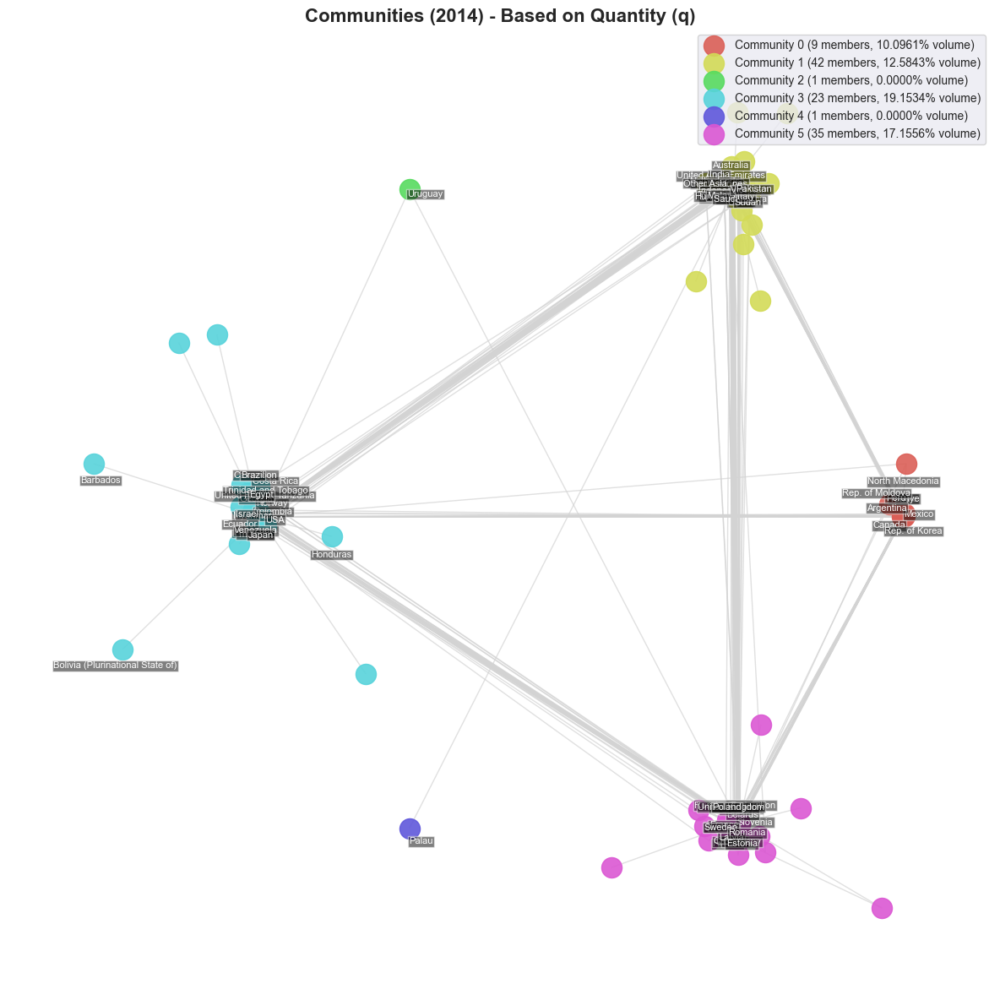

Top Countries by Community based on q:
Community 0:
  Chile | Canada | Rep. of Korea | Türkiye | Argentina | Mexico | Peru | Rep. of Moldova | North Macedonia
Community 1:
  China | India | Netherlands | Other Asia, nes | United Arab Emirates | South Africa | Singapore | Saudi Arabia | Italy | Iran | Australia | Ukraine | Philippines | Indonesia | Sudan | Viet Nam | Hungary | Pakistan | Malaysia | Nepal
Community 2:
  Uruguay
Community 3:
  USA | Japan | Thailand | Egypt | Colombia | Venezuela | Israel | Norway | Ecuador | United Rep. of Tanzania | Myanmar | Trinidad and Tobago | Georgia | Brazil | Costa Rica | Bahamas | Cameroon | Honduras | Barbados | Bolivia (Plurinational State of)
Community 4:
  Palau
Community 5:
  Belgium | Russian Federation | Germany | France | Spain | United Kingdom | Slovenia | Poland | Switzerland | Sweden | Greece | Austria | Estonia | Czechia | Portugal | Romania | Finland | Qatar | Belarus | Latvia


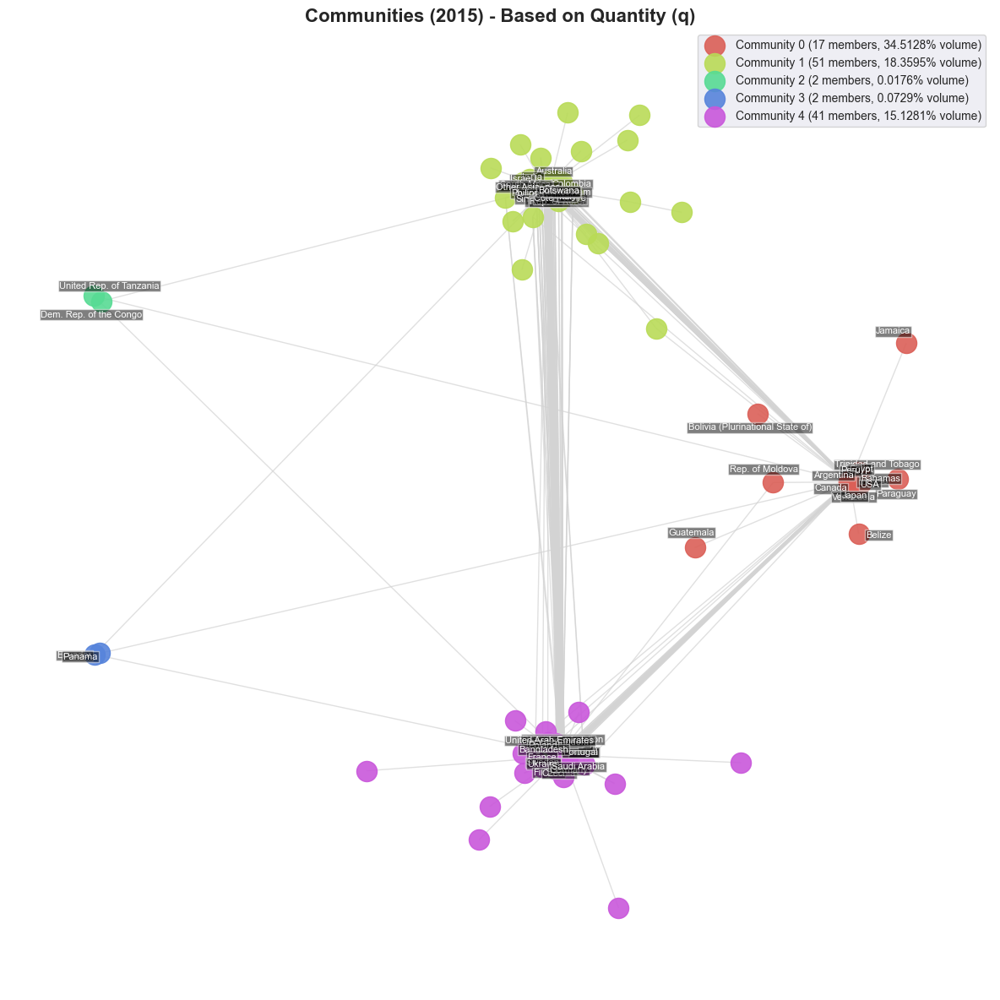

Top Countries by Community based on q:
Community 0:
  USA | Japan | Chile | Canada | Argentina | Mexico | Egypt | Venezuela | Peru | Bahamas | Trinidad and Tobago | Paraguay | Belize | Rep. of Moldova | Bolivia (Plurinational State of) | Guatemala | Jamaica
Community 1:
  China | Rep. of Korea | India | Netherlands | Other Asia, nes | South Africa | Thailand | Côte d'Ivoire | Singapore | Iran | Australia | Italy | Indonesia | Colombia | Kuwait | Morocco | Philippines | Botswana | Viet Nam | Israel
Community 2:
  United Rep. of Tanzania | Dem. Rep. of the Congo
Community 3:
  Ecuador | Panama
Community 4:
  Belgium | Russian Federation | Germany | Spain | France | United Arab Emirates | Slovenia | Türkiye | United Kingdom | Saudi Arabia | Sweden | Switzerland | Poland | Bangladesh | Ukraine | Greece | Austria | Czechia | Finland | Portugal


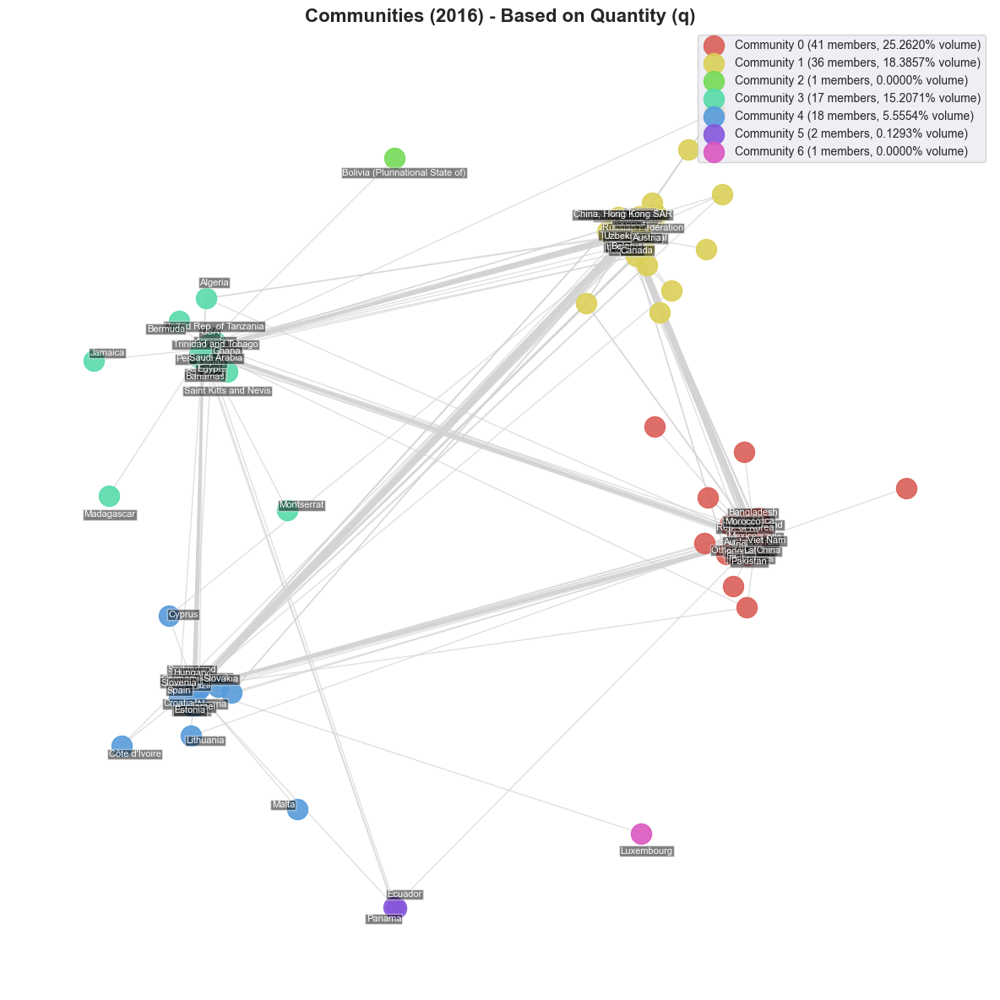

Top Countries by Community based on q:
Community 0:
  China | Chile | Rep. of Korea | India | Other Asia, nes | South Africa | Thailand | Singapore | Indonesia | Mexico | Australia | Iran | Philippines | Sudan | Viet Nam | Malaysia | Latvia | Pakistan | Bangladesh | Morocco
Community 1:
  Belgium | Russian Federation | Canada | United Kingdom | France | United Arab Emirates | Türkiye | Sweden | Poland | Ukraine | China, Hong Kong SAR | Austria | Czechia | Greece | Portugal | Qatar | Belarus | Serbia | Uzbekistan | Guinea
Community 2:
  Bolivia (Plurinational State of)
Community 3:
  USA | Japan | Argentina | Saudi Arabia | Egypt | Colombia | Peru | United Rep. of Tanzania | Bahamas | Trinidad and Tobago | Ghana | Saint Kitts and Nevis | Bermuda | Algeria | Jamaica | Montserrat | Madagascar
Community 4:
  Germany | Netherlands | Spain | Switzerland | Slovenia | Italy | Israel | Romania | Hungary | Brazil | Croatia | Estonia | Nigeria | Slovakia | Lithuania | Cyprus | Côte d'Ivoire | Mal

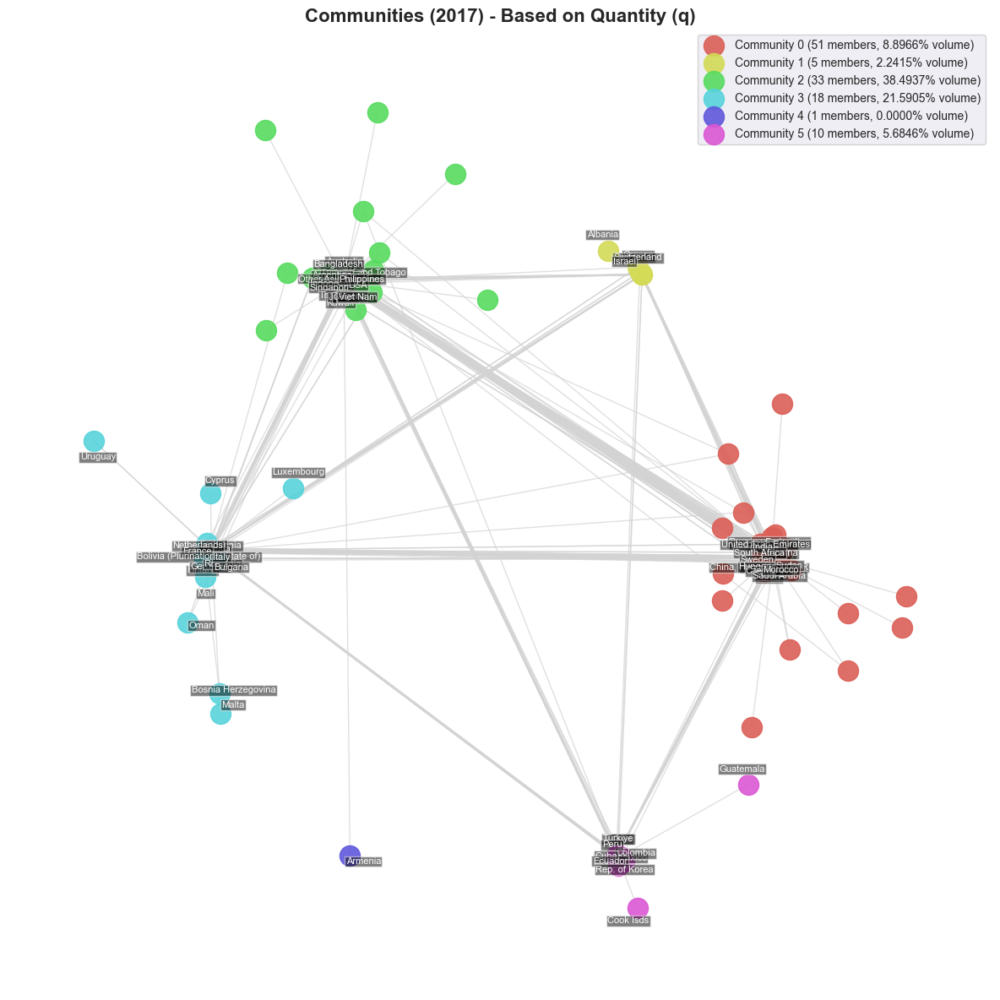

Top Countries by Community based on q:
Community 0:
  Belgium | Russian Federation | India | United Kingdom | South Africa | United Arab Emirates | Sweden | Poland | China, Hong Kong SAR | Iran | Saudi Arabia | Ukraine | Latvia | Czechia | Austria | Sudan | Tunisia | Hungary | Norway | Morocco
Community 1:
  Spain | Switzerland | Greece | Israel | Albania
Community 2:
  China | Japan | USA | Canada | Thailand | Other Asia, nes | Singapore | Argentina | Australia | Indonesia | Algeria | Egypt | Pakistan | Philippines | Kuwait | Viet Nam | Trinidad and Tobago | Brazil | Bangladesh | Venezuela
Community 3:
  Netherlands | Germany | France | Slovenia | Italy | Romania | Bolivia (Plurinational State of) | Finland | Serbia | Croatia | Bulgaria | Mali | Cyprus | Oman | Luxembourg | Bosnia Herzegovina | Malta | Uruguay
Community 4:
  Armenia
Community 5:
  Rep. of Korea | Chile | Türkiye | Mexico | Peru | Colombia | Cuba | Ecuador | Cook Isds | Guatemala


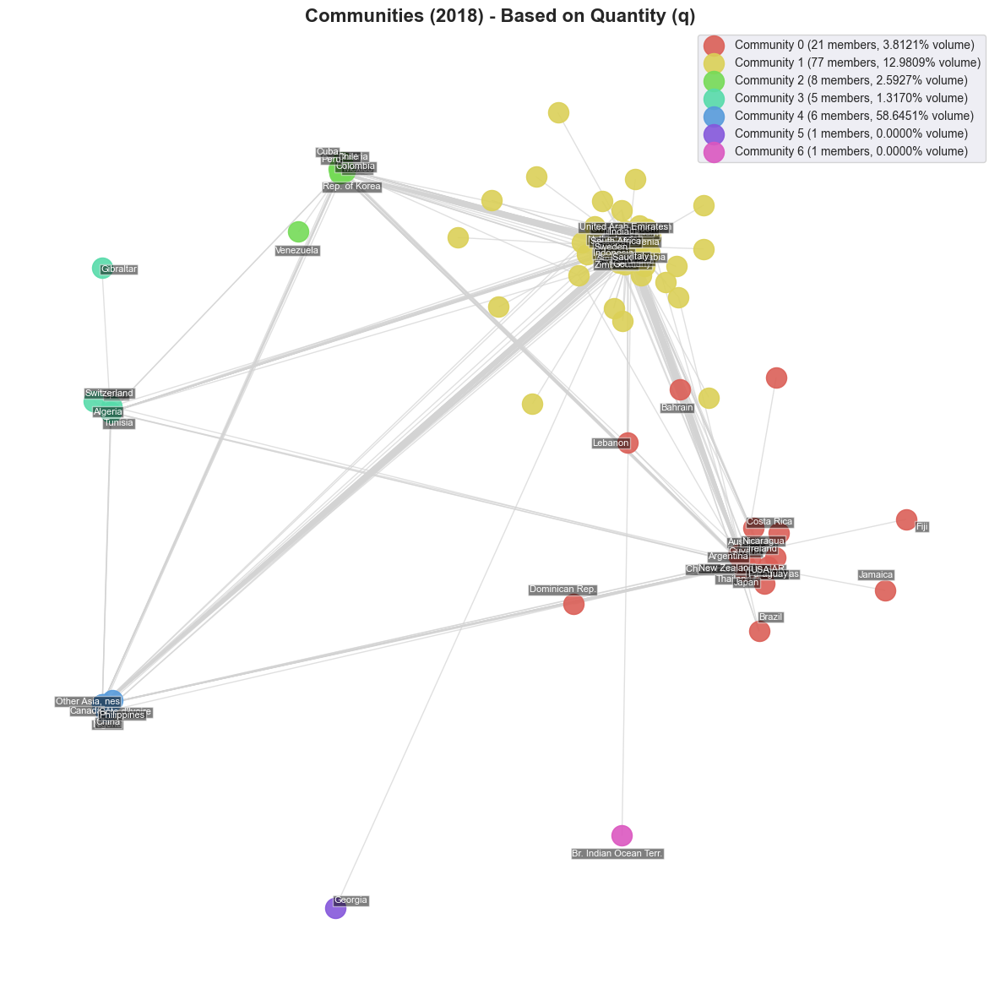

Top Countries by Community based on q:
Community 0:
  Japan | USA | Thailand | Argentina | Egypt | Australia | Guyana | New Zealand | China, Hong Kong SAR | Ireland | Bahamas | Paraguay | Costa Rica | Nicaragua | Brazil | Jamaica | Lebanon | Dominican Rep. | Fiji | Bahrain
Community 1:
  Netherlands | Germany | Russian Federation | Belgium | France | India | United Kingdom | Ghana | United Arab Emirates | Türkiye | Singapore | South Africa | Sweden | Czechia | Slovenia | Zimbabwe | Indonesia | Poland | Italy | Saudi Arabia
Community 2:
  Rep. of Korea | Chile | Mexico | Colombia | Austria | Peru | Cuba | Venezuela
Community 3:
  Spain | Switzerland | Tunisia | Algeria | Gibraltar
Community 4:
  China | Canada | Other Asia, nes | Nigeria | Philippines | Côte d'Ivoire
Community 5:
  Georgia
Community 6:
  Br. Indian Ocean Terr.


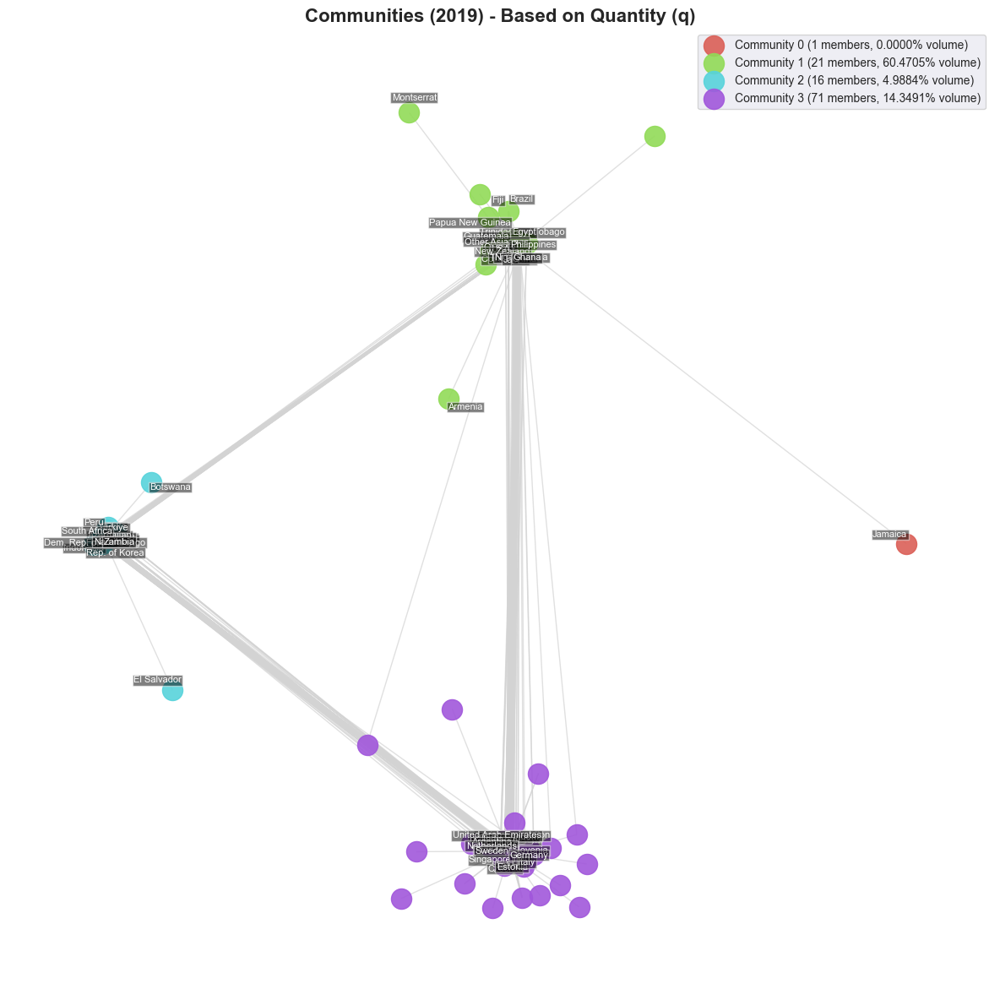

Top Countries by Community based on q:
Community 0:
  Jamaica
Community 1:
  China | Canada | Japan | USA | Ghana | Thailand | Other Asia, nes | Egypt | Nigeria | Philippines | Tunisia | New Zealand | Trinidad and Tobago | Guatemala | Papua New Guinea | Costa Rica | Brazil | Fiji | Armenia | Montserrat
Community 2:
  Rep. of Korea | Chile | Türkiye | Mexico | South Africa | Indonesia | Peru | Austria | Colombia | Zambia | Dem. Rep. of the Congo | Azerbaijan | Finland | Namibia | Botswana | El Salvador
Community 3:
  Russian Federation | Belgium | Netherlands | Germany | Spain | Switzerland | India | United Kingdom | France | Singapore | United Arab Emirates | Estonia | Argentina | Latvia | Sweden | Slovenia | Poland | Italy | Iran | Czechia


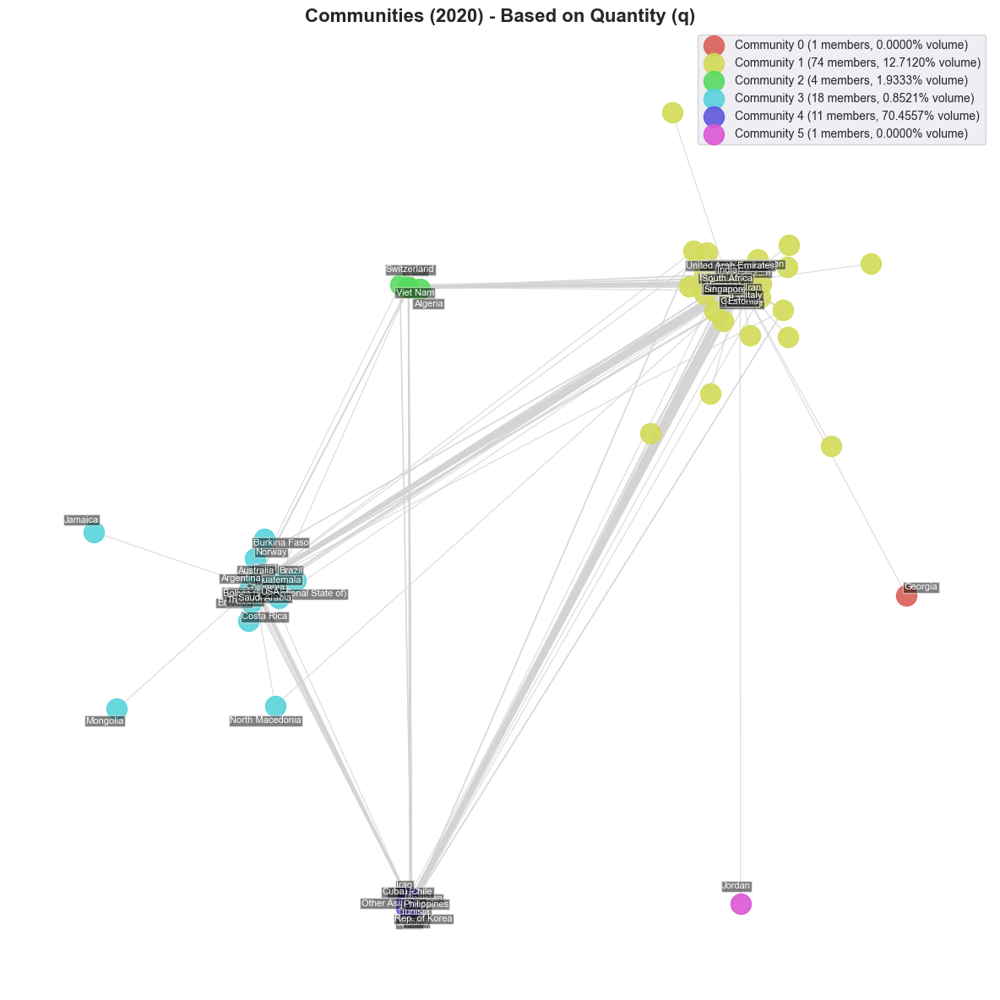

Top Countries by Community based on q:
Community 0:
  Georgia
Community 1:
  Russian Federation | Belgium | Netherlands | India | Germany | United Kingdom | France | United Arab Emirates | Estonia | Singapore | Türkiye | Poland | Sweden | Czechia | Latvia | Italy | South Africa | Iran | Zimbabwe | Indonesia
Community 2:
  Spain | Switzerland | Viet Nam | Algeria
Community 3:
  USA | Canada | Thailand | Argentina | Saudi Arabia | Australia | Egypt | Colombia | Ecuador | Brazil | Bolivia (Plurinational State of) | Guatemala | Norway | Costa Rica | Burkina Faso | North Macedonia | Jamaica | Mongolia
Community 4:
  China | Rep. of Korea | Japan | Chile | Other Asia, nes | Philippines | Iraq | Peru | Cuba | Pakistan | Tunisia
Community 5:
  Jordan


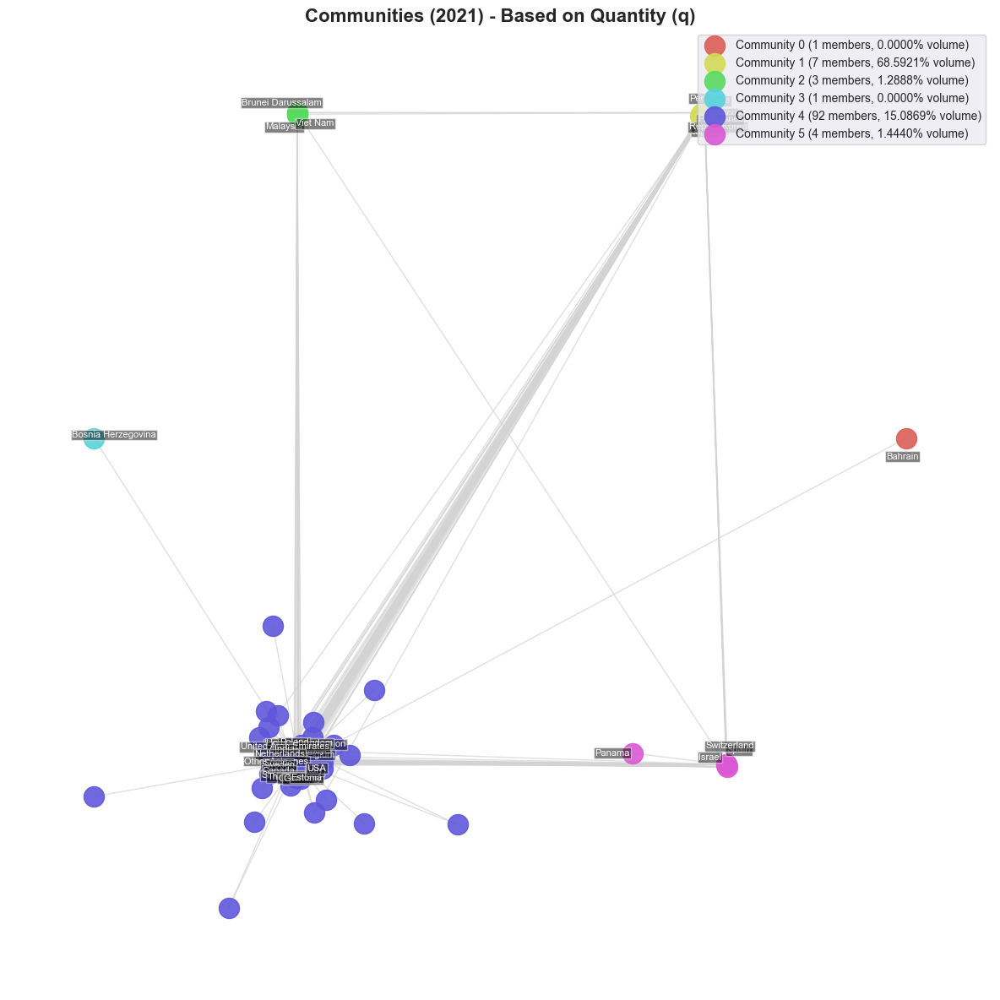

Top Countries by Community based on q:
Community 0:
  Bahrain
Community 1:
  China | Rep. of Korea | Japan | Chile | Mexico | Peru | Philippines
Community 2:
  Brunei Darussalam | Viet Nam | Malaysia
Community 3:
  Bosnia Herzegovina
Community 4:
  USA | Russian Federation | Netherlands | Belgium | Germany | India | France | Canada | United Arab Emirates | United Kingdom | Singapore | Türkiye | Estonia | Czechia | Australia | Poland | Thailand | Italy | Other Asia, nes | Sweden
Community 5:
  Spain | Switzerland | Israel | Panama


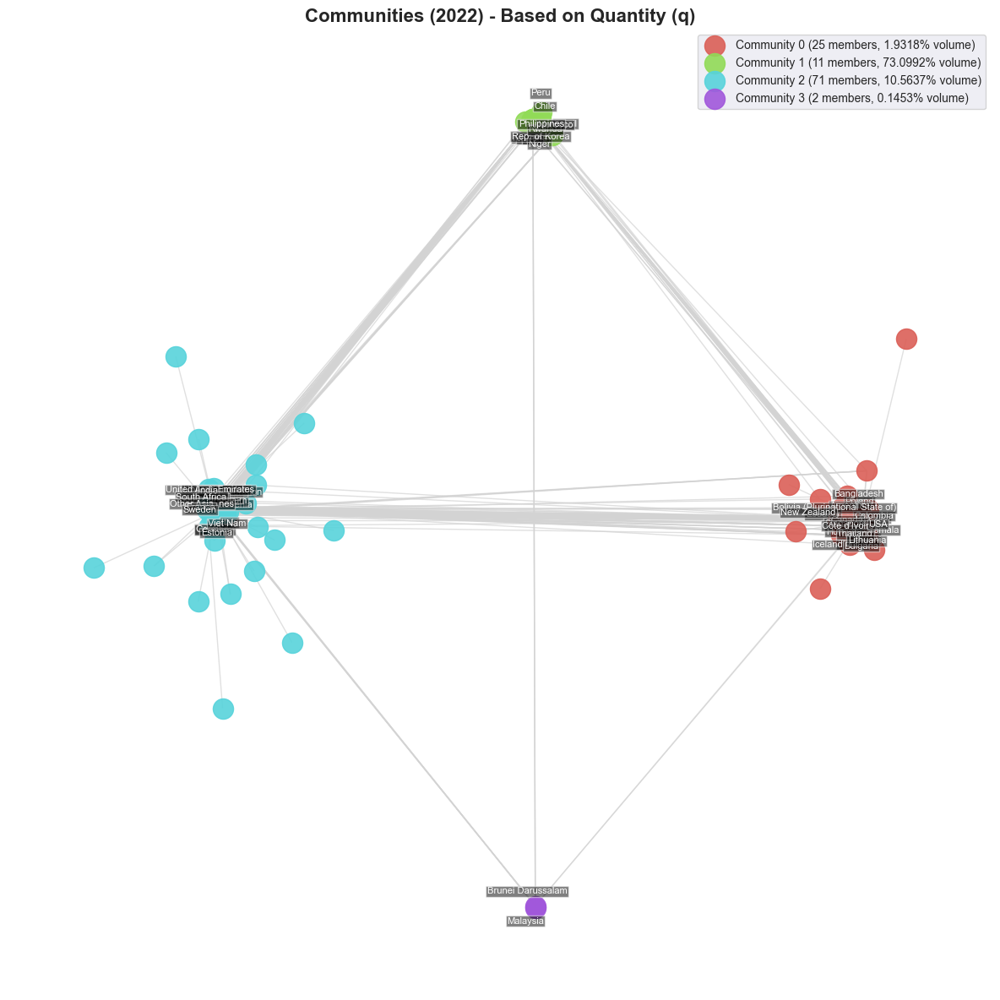

Top Countries by Community based on q:
Community 0:
  USA | Poland | Canada | Singapore | Argentina | Thailand | Mexico | Colombia | Hungary | Lithuania | Bangladesh | Finland | Bulgaria | Belarus | Côte d'Ivoire | Iceland | Bolivia (Plurinational State of) | Ecuador | Guatemala | New Zealand
Community 1:
  China | Rep. of Korea | Japan | Chile | Nigeria | Rwanda | Niger | Morocco | Philippines | Peru | Brazil
Community 2:
  Netherlands | Russian Federation | Germany | Belgium | United Kingdom | France | Sweden | Spain | Switzerland | India | United Arab Emirates | Other Asia, nes | Türkiye | Australia | Italy | Czechia | South Africa | Estonia | Viet Nam | Slovenia
Community 3:
  Malaysia | Brunei Darussalam


In [49]:
import polars as pl
import pandas as pd
import numpy as np
import networkx as nx
from community import community_louvain
import matplotlib.pyplot as plt
import seaborn as sns
import math

##############################################
# Data Selection
##############################################
df_lithium = df.filter(pl.col("k") == 282520).to_pandas()
df_lithium['t'] = df_lithium['t'].astype(int)

years = sorted(df_lithium['t'].unique())

##############################################
# Construction of Yearly Graphs
##############################################
yearly_graphs = {}
for y in years:
    df_year = df_lithium[df_lithium['t'] == y]
    df_agg = df_year.groupby(['export_country','import_country'], as_index=False)['q'].sum()

    G = nx.Graph()
    for _, row in df_agg.iterrows():
        exporter = row['export_country']
        importer = row['import_country']
        quantity = row['q']
        if exporter != importer:
            if G.has_edge(exporter, importer):
                G[exporter][importer]['weight'] += quantity
            else:
                G.add_edge(exporter, importer, weight=quantity)
    yearly_graphs[y] = G

##############################################
# Community Visualization
##############################################
sns.set_theme(style='darkgrid')

for y in years:
    G = yearly_graphs[y]
    if G.number_of_nodes() == 0:
        print(f"Year {y}: No nodes to plot.")
        continue

    # Community Detection
    if G.number_of_edges() > 0:
        partition = community_louvain.best_partition(G, weight='weight')
    else:
        partition = {n:0 for n in G.nodes()}

    communities = {}
    for n, c in partition.items():
        communities.setdefault(c, []).append(n)

    # Computation of Node Strenght based on the Volume "q"
    node_strengths = {}
    for n in G.nodes():
        strength = sum(d['weight'] for _,_,d in G.edges(n, data=True))
        node_strengths[n] = strength

    # Selection of Top Nodes per Community (Annotation and Summary Stats)
    top_per_community = {}
    top_n_per_comm = 20
    for c, nodes in communities.items():
        nodes_strength = [(n, node_strengths[n]) for n in nodes]
        nodes_strength.sort(key=lambda x:x[1], reverse=True)
        top_nodes_c = [x[0] for x in nodes_strength[:top_n_per_comm]]
        top_per_community[c] = top_nodes_c

    top_nodes = set()
    for c in top_per_community:
        top_nodes.update(top_per_community[c])

    pos = nx.spring_layout(G, seed=42, k=0.15, iterations=100)

    num_com = len(communities)
    radius = 2.0
    angles = np.linspace(0, 2*math.pi, num_com, endpoint=False)
    offsets = [(radius*math.cos(a), radius*math.sin(a)) for a in angles]

    sorted_communities = sorted(communities.keys())
    palette = sns.color_palette("hls", num_com)
    community_colors = {}
    for i, c in enumerate(sorted_communities):
        community_colors[c] = palette[i]

    for i, c in enumerate(sorted_communities):
        nodes = communities[c]
        cx = np.mean([pos[n][0] for n in nodes])
        cy = np.mean([pos[n][1] for n in nodes])
        ox, oy = offsets[i]
        for n in nodes:
            pos[n] = (pos[n][0] - cx + ox, pos[n][1] - cy + oy)

    plt.figure(figsize=(12,12))
    plt.title(f"Communities ({y}) - Based on Quantity (q)", fontsize=16, fontweight='bold')

    nx.draw_networkx_edges(G, pos, edge_color='lightgray', alpha=0.7)

    # Computation of Community Shares of the Volume
    total_volume = sum(d['weight'] for _,_,d in G.edges(data=True))
    community_volumes = {}
    for c in sorted_communities:
        com_nodes = set(communities[c])
        com_volume = sum(d['weight'] for (u,v,d) in G.edges(data=True) 
                         if u in com_nodes and v in com_nodes)
        community_volumes[c] = com_volume

    handles = []
    labels = []
    for c in sorted_communities:
        nodes = communities[c]
        scatter = nx.draw_networkx_nodes(G, pos, nodelist=nodes,
                                         node_color=[community_colors[c]],
                                         node_size=300, alpha=0.9)
        share = (community_volumes[c] / total_volume)*100 if total_volume > 0 else 0.0
        community_label = f"Community {c} ({len(nodes)} members, {share:.4f}% volume)"
        handles.append(scatter)
        labels.append(community_label)

    label_positions = {}
    top_nodes = list(top_nodes)
    for i, n in enumerate(top_nodes):
        x, y = pos[n]
        angle = 2*math.pi*(i/len(top_nodes))
        offset_dist = 0.10
        dx = offset_dist*math.cos(angle)
        dy = offset_dist*math.sin(angle)
        label_positions[n] = (x+dx, y+dy)

    nx.draw_networkx_labels(G, label_positions,
                            labels={n:n for n in top_nodes},
                            font_size=8, font_color='white',
                            bbox=dict(facecolor='black', alpha=0.5, pad=1))

    plt.axis('off')
    plt.legend(handles, labels, fontsize=10, loc='upper right', frameon=True)
    plt.tight_layout()
    plt.show()

    print("Top Countries by Community based on q:")
    for c in sorted_communities:
        print(f"Community {c}:\n  {' | '.join(top_per_community[c])}")
